## Setup and Imports

In [1]:
# Standard library imports
import os
import sys
from pathlib import Path
from typing import List

# Environment configuration
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
os.environ["PYOPENGL_PLATFORM"] = "egl"

# Set rendering backend
if sys.platform == "darwin":
    os.environ["MUJOCO_GL"] = "glfw"
    print("Using macOS with GLFW rendering")
else:
    os.environ["MUJOCO_GL"] = "egl"
    print("Using Linux with EGL rendering")

# Third-party imports
import h5py
import jax
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import mediapy as media
from mpl_toolkits.mplot3d.art3d import Line3DCollection
import mujoco
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import signal
from scipy.interpolate import interp1d
from sklearn.decomposition import PCA

# HuggingFace imports
import huggingface_hub as hf_hub

# Logging configuration
from absl import logging as absl_logging
absl_logging.set_verbosity(absl_logging.ERROR)

# Local/project imports
from track_mjx.agent import checkpointing
from track_mjx.analysis import rollout, render

# Set plot style
plt.style.use('seaborn-v0_8')
colorblind_colors = ['#1f77b4', '#bd6212', '#8E44AD']  # Blue, Orange, Purple

def get_joint_qpos(model, qposes, joint_name):
    """Get qpos value(s) for a specific joint by name."""
    joint_id = mujoco.mj_name2id(model, mujoco.mjtObj.mjOBJ_JOINT, joint_name)
    if joint_id == -1:
        print(f"Joint '{joint_name}' not found!")
        return None

    qpos_addr = model.jnt_qposadr[joint_id]
    joint_type = model.jnt_type[joint_id]

    if joint_type == mujoco.mjtJoint.mjJNT_FREE:
        return qposes[:, qpos_addr : qpos_addr + 7]
    elif joint_type == mujoco.mjtJoint.mjJNT_HINGE:
        return qposes[:, qpos_addr]
    elif joint_type == mujoco.mjtJoint.mjJNT_BALL:
        return qposes[:, qpos_addr : qpos_addr + 4]
    else:
        return qposes[:, qpos_addr]

Using Linux with EGL rendering


## Configuration

In [2]:
# Checkpoint paths
ckpt_path = Path("/root/vast/eric/track-mjx/model_checkpoints/250910_193810_184284/")  # Physics-Aware
joint_ckpt_path = Path("/root/vast/eric/track-mjx/model_checkpoints/250908_134318_569695/")  # Joint Reward Only

# EMG data paths and configuration
MUSCLE_CONFIGS = [
    (5, "Triceps Lateral", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_triceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Triceps"),
    (8, "Biceps Long", "/root/vast/eric/CVAT_mouse_reach/csvs/emg_biceps_fixed_A36-1_2023-07-18_16-54-01_lightOff_tone_on.csv", "Biceps"),
]

# Trial data CSV
TRIAL_CSV = '/root/vast/eric/CVAT_mouse_reach/csvs/A36-1_2023-07-18_16-54-01_lightOff_tone_on_off_trials_edited.csv'

# Number of trials to analyze
NUM_TRIALS = 46

print(f"Physics-Aware checkpoint: {ckpt_path}")
print(f"  Exists: {ckpt_path.exists()}")
print(f"Joint Reward Only checkpoint: {joint_ckpt_path}")
print(f"  Exists: {joint_ckpt_path.exists()}")

Physics-Aware checkpoint: /root/vast/eric/track-mjx/model_checkpoints/250910_193810_184284
  Exists: True
Joint Reward Only checkpoint: /root/vast/eric/track-mjx/model_checkpoints/250908_134318_569695
  Exists: True


## Download Reference Data

In [3]:
# Download all mouse_arm data files from HuggingFace
data_local_dir = Path.cwd().parent
data_download_dir = hf_hub.snapshot_download(
    repo_id="talmolab/MIMIC-MJX", 
    repo_type="dataset",
    allow_patterns="data/mouse_arm/*.h5",
    local_dir=data_local_dir
)
print(f"Downloaded all mouse_arm data to {data_download_dir}")

# List downloaded files
mouse_arm_dir = Path(data_download_dir) / "data" / "mouse_arm"
h5_files = list(mouse_arm_dir.glob("*.h5"))
print(f"Found {len(h5_files)} H5 files")

/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Fetching 46 files: 100%|██████████| 46/46 [00:00<00:00, 477.33it/s]

Downloaded all mouse_arm data to /root/vast/eric/track-mjx
Found 46 H5 files


## Load Checkpoint and Configure Environment

In [4]:
# Load the Physics-Aware checkpoint at step 2
ckpt = checkpointing.load_checkpoint_for_eval(ckpt_path, step=2)
cfg = ckpt["cfg"]

# Load the Joint Reward Only checkpoint at step 2
joint_ckpt = checkpointing.load_checkpoint_for_eval(joint_ckpt_path, step=2)
joint_cfg = joint_ckpt["cfg"]

# Update the data path to the downloaded reference data
if h5_files:
    cfg.data_path = ",".join(str(f) for f in sorted(h5_files))
    joint_cfg.data_path = ",".join(str(f) for f in sorted(h5_files))
    print(f"Using {len(h5_files)} data files")
else:
    print("No H5 files found!")


Loading checkpoint from /root/vast/eric/track-mjx/model_checkpoints/250910_193810_184284 at step 2
Loading checkpoint from /root/vast/eric/track-mjx/model_checkpoints/250908_134318_569695 at step 2
Using 46 data files


## Create Environment and Rollout Generator

In [5]:
# Create environment and rollout generator for Physics-Aware model
env = rollout.create_environment(cfg)
inference_fn = checkpointing.load_inference_fn(cfg, ckpt["policy"])
generate_rollout = rollout.create_rollout_generator(
    cfg, 
    env, 
    inference_fn, 
    log_activations=True, 
    log_metrics=True, 
    log_sensor_data=True,
)

# Create environment and rollout generator for Joint Reward Only model
joint_env = rollout.create_environment(joint_cfg)
joint_inference_fn = checkpointing.load_inference_fn(joint_cfg, joint_ckpt["policy"])
joint_generate_rollout = rollout.create_rollout_generator(
    joint_cfg, 
    joint_env, 
    joint_inference_fn, 
    log_activations=True, 
    log_metrics=True, 
    log_sensor_data=True,
)


/root/miniforge3/envs/track_mjx/lib/python3.11/site-packages/brax/io/mjcf.py:480: UserWarning: Brax System, piplines and environments are not actively being maintained. Please see MJX for a well maintained JAX-based physics engine: https://github.com/google-deepmind/mujoco/tree/main/mjx. For a host of environments that use MJX, see: https://github.com/google-deepmind/mujoco_playground.
  warnings.warn(


## Generate Batch Rollouts

Generate rollouts for all clips in parallel using JAX's vectorized execution.

In [6]:
# Enable JAX compilation cache for faster subsequent runs
persistent_cache = True
if persistent_cache:
    jax.config.update("jax_compilation_cache_dir", "/tmp/jax_cache")
    jax.config.update("jax_persistent_cache_min_entry_size_bytes", -1)
    jax.config.update("jax_persistent_cache_min_compile_time_secs", 0)
    jax.config.update(
        "jax_persistent_cache_enable_xla_caches",
        "xla_gpu_per_fusion_autotune_cache_dir",
    )

# Create JIT-compiled vectorized rollout functions
jit_vmap_generate_rollout = jax.jit(jax.vmap(generate_rollout))
jit_vmap_joint_generate_rollout = jax.jit(jax.vmap(joint_generate_rollout))

# Generate rollouts for all 46 clips
start_idx, end_idx = 0, 46
clip_idxs = np.arange(start_idx, end_idx)

print("Generating Physics-Aware model rollouts...")
batch_rollout = jit_vmap_generate_rollout(clip_idxs)
print(f"  Keys available: {list(batch_rollout.keys())}")
print(f"  Actions shape: {batch_rollout['ctrl'].shape}")
print(f"  Qpos rollout shape: {batch_rollout['qposes_rollout'].shape}")

print("\nGenerating Joint Reward Only model rollouts...")
joint_batch_rollout = jit_vmap_joint_generate_rollout(clip_idxs)
print(f"  Keys available: {list(joint_batch_rollout.keys())}")
print(f"  Actions shape: {joint_batch_rollout['ctrl'].shape}")
print(f"  Qpos rollout shape: {joint_batch_rollout['qposes_rollout'].shape}")


Generating Physics-Aware model rollouts...
  Keys available: ['activations', 'ctrl', 'joint_forces', 'qposes_ref', 'qposes_rollout', 'rollout_metrics', 'sensor_readings', 'state_rewards']
  Actions shape: (46, 119, 9)
  Qpos rollout shape: (46, 120, 4)

Generating Joint Reward Only model rollouts...
  Keys available: ['activations', 'ctrl', 'joint_forces', 'qposes_ref', 'qposes_rollout', 'rollout_metrics', 'sensor_readings', 'state_rewards']
  Actions shape: (46, 119, 9)
  Qpos rollout shape: (46, 120, 4)


## Save Rollout Data to H5 File

Save the batch rollout data in a format compatible with the EMG analysis scripts.

In [7]:
# Save rollout data to H5 file
output_h5_path = ckpt_path / "rollouts_full_mouse_arm_physics_aware.h5"

with h5py.File(output_h5_path, "w") as f:
    # Save actions (muscle activations) - this is the 'ctrl' field from batch_rollout
    f.create_dataset("actions", data=np.array(batch_rollout["ctrl"]))
    
    # Save qpos data
    f.create_dataset("qposes_rollout", data=np.array(batch_rollout["qposes_rollout"]))
    f.create_dataset("qposes_ref", data=np.array(batch_rollout["qposes_ref"]))
    
    # Save activations if available
    if "activations" in batch_rollout:
        activations_group = f.create_group("activations")
        
        # Save decoder activations
        if "decoder" in batch_rollout["activations"]:
            decoder_group = activations_group.create_group("decoder")
            for key, value in batch_rollout["activations"]["decoder"].items():
                decoder_group.create_dataset(key, data=np.array(value))
        
        # Save intention activations
        if "intention" in batch_rollout["activations"]:
            activations_group.create_dataset("intention", data=np.array(batch_rollout["activations"]["intention"]))

print(f"Saved rollout data to: {output_h5_path}")
print(f"Actions shape: {batch_rollout['ctrl'].shape}")

Saved rollout data to: /root/vast/eric/track-mjx/model_checkpoints/250910_193810_184284/rollouts_full_mouse_arm_physics_aware.h5
Actions shape: (46, 119, 9)


## Joint Angle Tracking Visualization

Compare reference joint angles with simulation rollout for individual clips.

In [8]:
def plot_joint_angles_comparison(
    qpos_sim,
    qpos_ref, 
    clip_id=0,
    joint_indices=None,
    joint_names=None,
    joint_labels=None,
    save_path=None,
    sim_hz=200,
    max_time=0.25,
    model_name="Simulation",
    model_color=None,
):
    """Plot reference vs rollout joint angles for a given clip.
    
    Args:
        qpos_sim: Simulation qpos array (clips, T, nq)
        qpos_ref: Reference qpos array (clips, T, nq)
        clip_id: Clip index to visualize
        joint_indices: Joint indices to plot
        joint_names: Names for titles
        joint_labels: Labels for y-axis
        save_path: PDF/PNG path to save
        sim_hz: Simulation sampling rate
        max_time: Maximum time to plot in seconds
        model_name: Name of the model for legend
        model_color: Color for the model line
        
    Returns:
        matplotlib.figure.Figure
    """
    # Set default values
    if joint_indices is None:
        joint_indices = [0, 1, 2, 3]
    if joint_names is None:
        joint_names = ["sh_elv", "sh_ext", "sh_rot", "elbow"]
    if joint_labels is None:
        joint_labels = ["Sh Elevation", "Sh Extension", "Sh Rotation", "Elbow"]
    if model_color is None:
        model_color = colorblind_colors[0]
    
    # Extract clip data
    if clip_id >= qpos_sim.shape[0]:
        raise IndexError(f"clip_id {clip_id} out of range (total={qpos_sim.shape[0]}).")
    
    sim_clip = qpos_sim[clip_id]  # (T, nq)
    ref_clip = qpos_ref[clip_id]  # (T, nq)
    
    # Align DOFs if shapes differ
    nq = min(sim_clip.shape[1], ref_clip.shape[1])
    sim_clip = sim_clip[:, :nq]
    ref_clip = ref_clip[:, :nq]
    
    # Ensure same time length
    min_T = min(sim_clip.shape[0], ref_clip.shape[0])
    sim_clip = sim_clip[:min_T]
    ref_clip = ref_clip[:min_T]
    
    # Create time axis and filter by max_time
    time = np.arange(min_T) / float(sim_hz)
    
    if max_time is not None:
        time_idx = np.searchsorted(time, max_time, side='right')
        time = time[:time_idx]
        sim_clip = sim_clip[:time_idx]
        ref_clip = ref_clip[:time_idx]
    
    # Calculate global y-limits across all joints
    all_vals = []
    for j in joint_indices:
        all_vals.extend(np.degrees(sim_clip[:, j][np.isfinite(sim_clip[:, j])]))
        all_vals.extend(np.degrees(ref_clip[:, j][np.isfinite(ref_clip[:, j])]))
    
    if not all_vals:
        raise ValueError("No finite joint angle data to plot.")
    
    y_min = np.min(all_vals) - 5
    y_max = np.max(all_vals) + 5
    
    # Create figure
    fig, axes = plt.subplots(len(joint_indices), 1, figsize=(3, 8), sharex=True)
    axes = np.atleast_1d(axes)
    
    # Plot each joint
    for i, (j, name, label) in enumerate(zip(joint_indices, joint_names, joint_labels)):
        # Convert to degrees
        ref_deg = np.degrees(ref_clip[:, j])
        sim_deg = np.degrees(sim_clip[:, j])
        
        # Create masks for valid data
        ref_mask = np.isfinite(ref_deg)
        sim_mask = np.isfinite(sim_deg)
        both = ref_mask & sim_mask
        
        # Plot reference
        axes[i].plot(time[ref_mask], ref_deg[ref_mask],
                    color=colorblind_colors[2], label="Reference", linewidth=3, linestyle='--', alpha=0.8)
        
        # Plot simulation
        axes[i].plot(time[sim_mask], sim_deg[sim_mask],
                    color=model_color, label=model_name, linewidth=3)
        
        # Highlight difference
        if np.any(both):
            axes[i].fill_between(time[both], ref_deg[both], sim_deg[both],
                                alpha=0.2, color="gray")
        
        # Configure appearance
        axes[i].set_ylabel(f"{label} (°)", fontsize=18)
        axes[i].set_ylim(y_min, y_max)
        axes[i].set_title(f"{name}", fontsize=20, fontweight='bold')
        axes[i].grid(True, alpha=0.3)
        axes[i].tick_params(axis='both', which='major', labelsize=14)
        
        if max_time is not None:
            axes[i].set_xlim(0, max_time)
        else:
            axes[i].set_xlim(0, time[-1])
        
        # Legend on first subplot
        if i == 0:
            axes[i].legend(loc='upper right', fontsize=14)
    
    # X-axis label
    axes[-1].set_xlabel("Time (seconds)", fontsize=18)
    
    plt.suptitle(f"{model_name}: Joint Angle Tracking (Clip {clip_id})", 
                fontsize=22, fontweight='bold', y=0.995)
    plt.tight_layout()
    
    # Save if path provided
    if save_path:
        plt.savefig(save_path, bbox_inches="tight", dpi=300)
    
    return fig

Creating joint angle tracking plot for both models (clip 32)...


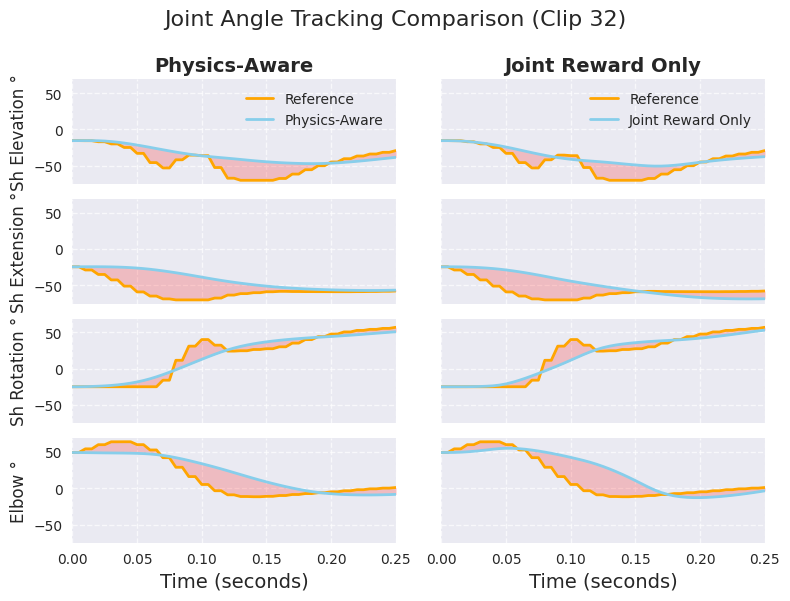

Saved joint angle comparison plot to: /root/vast/eric/track-mjx/model_checkpoints/250910_193810_184284/joint_angle_tracking_comparison_clip32.pdf


In [23]:
# Configuration for joint angle plotting
CLIP_ID = 32  # Clip index to visualize
JOINT_INDICES = [0, 1, 2, 3]  # Joint indices to plot
JOINT_NAMES = ["sh_elv", "sh_ext", "sh_rot", "elbow"]
JOINT_LABELS = ["Sh Elevation", "Sh Extension", "Sh Rotation", "Elbow"]
MAX_TIME = 0.25  # Only show first 250ms

# Create side-by-side comparison plot (2 columns, 4 rows)
print(f"Creating joint angle tracking plot for both models (clip {CLIP_ID})...")

# Extract data
physics_qpos_sim = batch_rollout["qposes_rollout"]
physics_qpos_ref = batch_rollout["qposes_ref"]
joint_qpos_sim = joint_batch_rollout["qposes_rollout"]
joint_qpos_ref = joint_batch_rollout["qposes_ref"]

# Extract clips
physics_sim = physics_qpos_sim[CLIP_ID]
physics_ref = physics_qpos_ref[CLIP_ID]
joint_sim = joint_qpos_sim[CLIP_ID]
joint_ref = joint_qpos_ref[CLIP_ID]

# Ensure same time length for both models
min_T_physics = min(physics_sim.shape[0], physics_ref.shape[0])
min_T_joint = min(joint_sim.shape[0], joint_ref.shape[0])
min_T = min(min_T_physics, min_T_joint)

physics_sim = physics_sim[:min_T]
physics_ref = physics_ref[:min_T]
joint_sim = joint_sim[:min_T]
joint_ref = joint_ref[:min_T]

# Create time axis
sim_hz = 200
time = np.arange(min_T) / float(sim_hz)

# Filter by max time
if MAX_TIME is not None:
    time_idx = np.searchsorted(time, MAX_TIME, side='right')
    time = time[:time_idx]
    physics_sim = physics_sim[:time_idx]
    physics_ref = physics_ref[:time_idx]
    joint_sim = joint_sim[:time_idx]
    joint_ref = joint_ref[:time_idx]

# Calculate global y-limits across all joints and both models
all_vals = []
for j in JOINT_INDICES:
    all_vals.extend(np.degrees(physics_sim[:, j][np.isfinite(physics_sim[:, j])]))
    all_vals.extend(np.degrees(physics_ref[:, j][np.isfinite(physics_ref[:, j])]))
    all_vals.extend(np.degrees(joint_sim[:, j][np.isfinite(joint_sim[:, j])]))
    all_vals.extend(np.degrees(joint_ref[:, j][np.isfinite(joint_ref[:, j])]))

y_min = np.min(all_vals) - 5
y_max = np.max(all_vals) + 5

# Create figure with 2 columns, 4 rows - matching reference style
fig, axes = plt.subplots(4, 2, figsize=(8, 6), sharex=True, sharey=True)

# Plot each joint
for i, (j, name, label) in enumerate(zip(JOINT_INDICES, JOINT_NAMES, JOINT_LABELS)):
    # Physics-Aware (left column)
    ax_physics = axes[i, 0]
    
    physics_ref_deg = np.degrees(physics_ref[:, j])
    physics_sim_deg = np.degrees(physics_sim[:, j])
    
    physics_ref_mask = np.isfinite(physics_ref_deg)
    physics_sim_mask = np.isfinite(physics_sim_deg)
    physics_both = physics_ref_mask & physics_sim_mask
    
    # Plot reference trajectory (orange)
    ax_physics.plot(time[physics_ref_mask], physics_ref_deg[physics_ref_mask],
                   color='orange', label="Reference", linewidth=2)
    
    # Plot simulation trajectory (skyblue)
    ax_physics.plot(time[physics_sim_mask], physics_sim_deg[physics_sim_mask],
                   color='skyblue', label="Physics-Aware", linewidth=2)
    
    # Highlight difference (red shaded area)
    if np.any(physics_both):
        ax_physics.fill_between(time[physics_both], physics_ref_deg[physics_both], 
                               physics_sim_deg[physics_both], alpha=0.2, color="red")
    
    ax_physics.set_ylabel(f"{label} °", fontsize=12)
    ax_physics.set_ylim(y_min, y_max)
    ax_physics.grid(True, linestyle='--', alpha=0.7)
    ax_physics.tick_params(axis='both', which='major', labelsize=10)
    
    # Add title to each row (left side)
    if i == 0:
        ax_physics.set_title("Physics-Aware", fontsize=14, fontweight='bold')
    
    # Add legend to first subplot only
    if i == 0:
        ax_physics.legend(loc='upper right', fontsize=10)
    
    # Joint Reward Only (right column)
    ax_joint = axes[i, 1]
    
    joint_ref_deg = np.degrees(joint_ref[:, j])
    joint_sim_deg = np.degrees(joint_sim[:, j])
    
    joint_ref_mask = np.isfinite(joint_ref_deg)
    joint_sim_mask = np.isfinite(joint_sim_deg)
    joint_both = joint_ref_mask & joint_sim_mask
    
    # Plot reference trajectory (orange)
    ax_joint.plot(time[joint_ref_mask], joint_ref_deg[joint_ref_mask],
                 color='orange', label="Reference", linewidth=2)
    
    # Plot simulation trajectory (skyblue)
    ax_joint.plot(time[joint_sim_mask], joint_sim_deg[joint_sim_mask],
                 color='skyblue', label="Joint Reward Only", linewidth=2)
    
    # Highlight difference (red shaded area)
    if np.any(joint_both):
        ax_joint.fill_between(time[joint_both], joint_ref_deg[joint_both],
                             joint_sim_deg[joint_both], alpha=0.2, color="red")
    
    ax_joint.set_ylim(y_min, y_max)
    ax_joint.grid(True, linestyle='--', alpha=0.7)
    ax_joint.tick_params(axis='both', which='major', labelsize=10)
    
    # Add title to top row
    if i == 0:
        ax_joint.set_title("Joint Reward Only", fontsize=14, fontweight='bold')
    
    # Add legend to first subplot only
    if i == 0:
        ax_joint.legend(loc='upper right', fontsize=10)

# X-axis labels for bottom row only
axes[-1, 0].set_xlabel("Time (seconds)", fontsize=14)
axes[-1, 1].set_xlabel("Time (seconds)", fontsize=14)

# Set x-limits
if MAX_TIME is not None:
    for ax in axes.flat:
        ax.set_xlim(0, MAX_TIME)

plt.suptitle(f"Joint Angle Tracking Comparison (Clip {CLIP_ID})", 
            fontsize=16, y=0.995)
plt.tight_layout()

# Save figure
save_path = ckpt_path / f"joint_angle_tracking_comparison_clip{CLIP_ID}.pdf"
plt.savefig(save_path, bbox_inches="tight", dpi=600)
plt.show()

print(f"Saved joint angle comparison plot to: {save_path}")

## EMG Processing Functions

In [10]:
# Load trial mask
df = pd.read_csv(TRIAL_CSV)

trial_mask = (
    (df['start'].notna()) & 
    (df['end'].notna()) & 
    (df['start'] > 0) & 
    (df['end'] > 0) &
    (df['start'] != df['end'])
)

valid_trials_df = df[trial_mask].copy()
print(f"Valid trials: {len(valid_trials_df)}")

def process_emg_data_individual_trials(emg_file_path, target_samples, num_trials=NUM_TRIALS, duration_ms=250):
    """Process EMG data and return individual trial envelopes"""
    # EMG processing parameters
    fs = 30000
    highpass_cutoff = 20
    lowpass_cutoff = 1000
    envelope_cutoff = 50
    filter_order = 4
    
    # Calculate EMG samples for duration
    emg_duration_samples = int(duration_ms / 1000 * fs)  # Convert ms to samples
    
    # Load EMG data
    emg_data = pd.read_csv(emg_file_path, header=None)
    
    reach_envelopes_processed = []
    
    for i, (idx, row) in enumerate(valid_trials_df.iterrows()):
        if i >= num_trials:
            break
            
        trial_num = idx
        emg_reach_start = int(1/200 * row['start'] * 30000)
        emg_reach_end = emg_reach_start + emg_duration_samples
        
        if trial_num < len(emg_data):
            trial_emg = emg_data.iloc[trial_num, :]
            
            # Process EMG signal
            b, a = signal.butter(filter_order, [highpass_cutoff, lowpass_cutoff], btype='bandpass', fs=fs)
            filtered_emg = signal.filtfilt(b, a, trial_emg)
            
            rectified_emg = np.abs(filtered_emg)
            
            b_env, a_env = signal.butter(filter_order, envelope_cutoff, btype='lowpass', fs=fs)
            emg_envelope = signal.filtfilt(b_env, a_env, rectified_emg)
            
            # Extract envelope during reach period
            if emg_reach_start < len(emg_envelope) and emg_reach_end <= len(emg_envelope):
                reach_envelope = emg_envelope[emg_reach_start:emg_reach_end]
                
                if len(reach_envelope) > 0:
                    # Resample to match target_samples
                    original_time = np.linspace(0, 1, len(reach_envelope))
                    target_time = np.linspace(0, 1, target_samples)
                    resampled_envelope = np.interp(target_time, original_time, reach_envelope)
                    
                    reach_envelopes_processed.append(resampled_envelope)
    
    if not reach_envelopes_processed:
        return None
    
    # Convert to numpy array and normalize
    envelopes_array = np.array(reach_envelopes_processed)
    norm_value = np.percentile(envelopes_array, 98)
    normalized_envelopes = envelopes_array / norm_value
    
    return normalized_envelopes

Valid trials: 46


## Trial-by-Trial EMG vs Simulation Comparison

Compare simulated muscle activations with EMG recordings for individual trials.

Resampling from 59 to 50 timesteps
Processing Joint Reward Only model data...
Joint Reward Only actions shape: (46, 119, 9)
Resampling Joint Reward Only from 59 to 50 timesteps
Processing EMG data...
  Processing Triceps...
  Processing Biceps...
Creating plot for Trial 1...


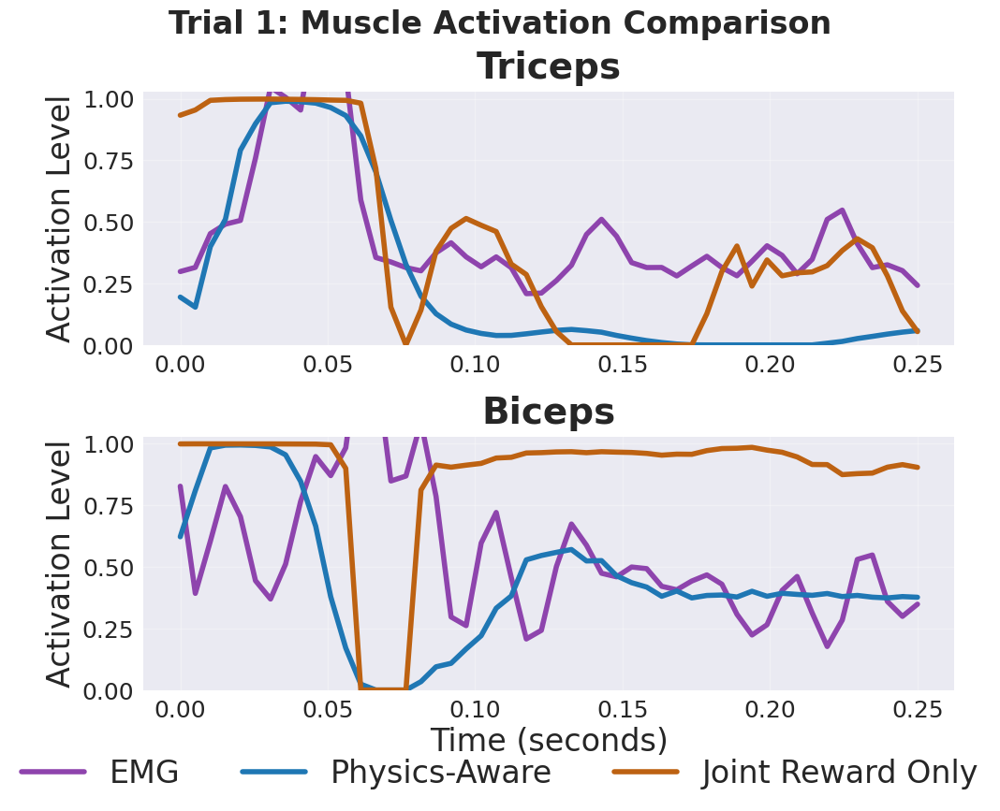

Creating plot for Trial 2...


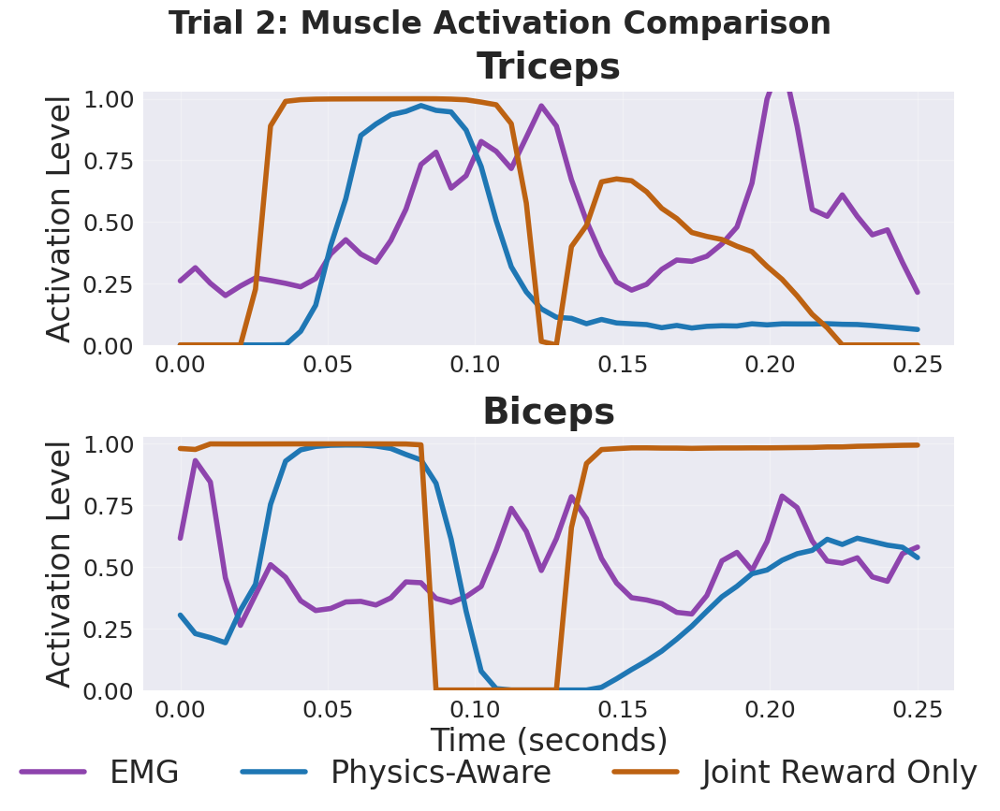

Creating plot for Trial 3...


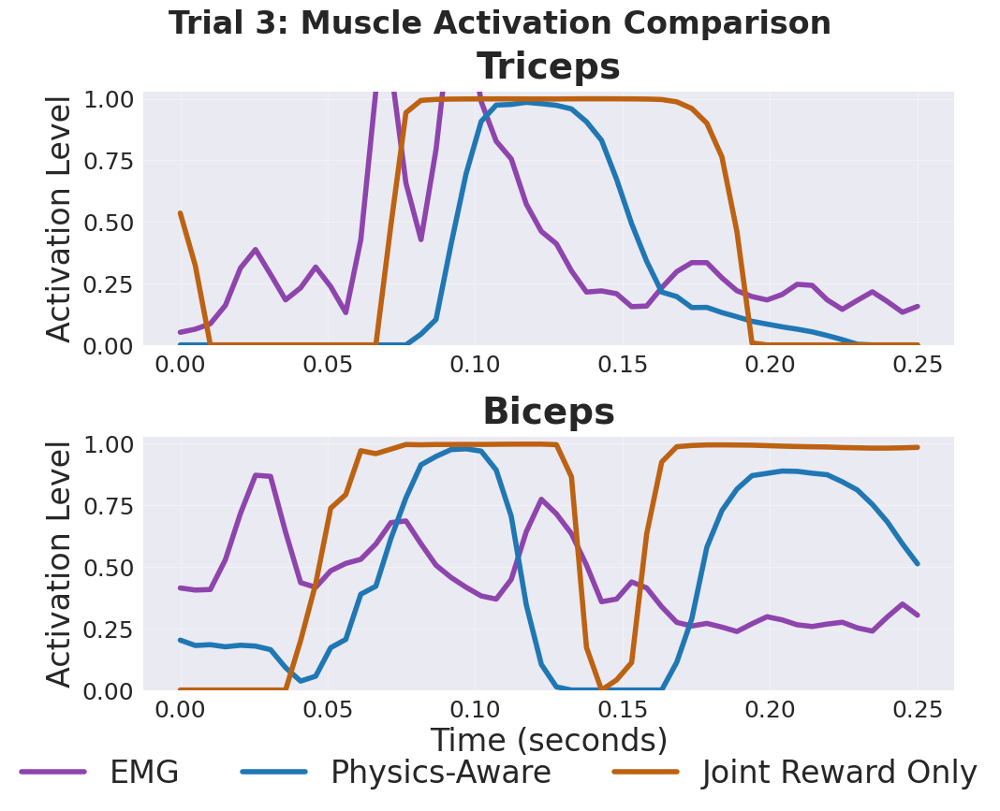

Creating plot for Trial 4...


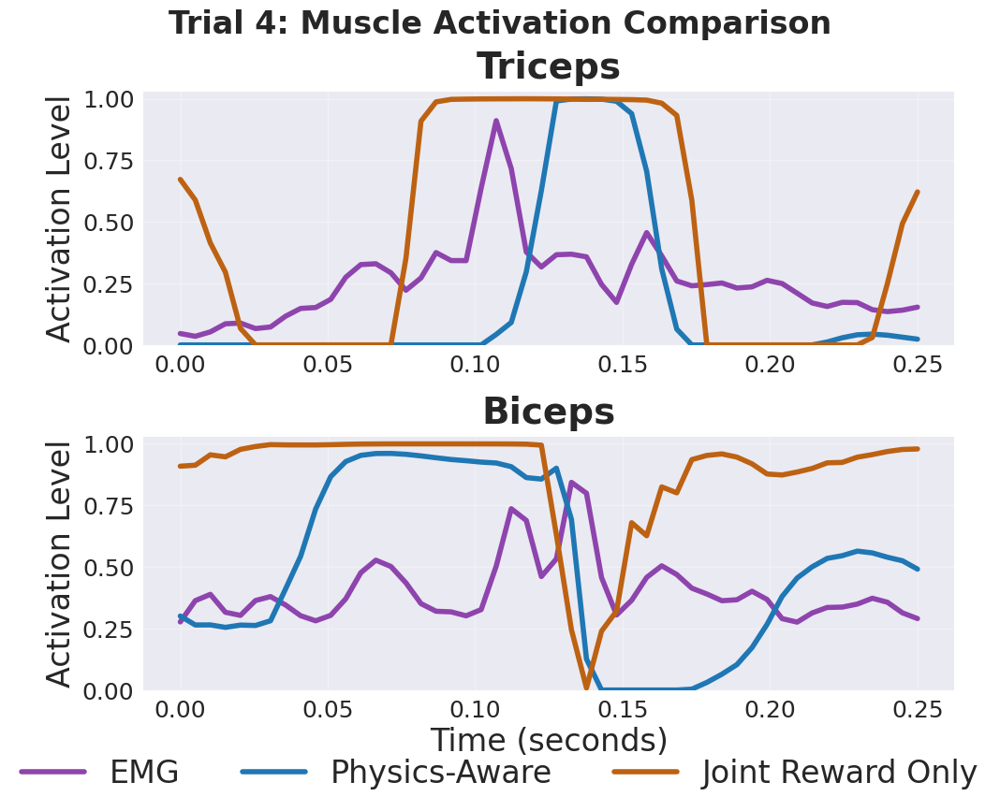

Creating plot for Trial 5...


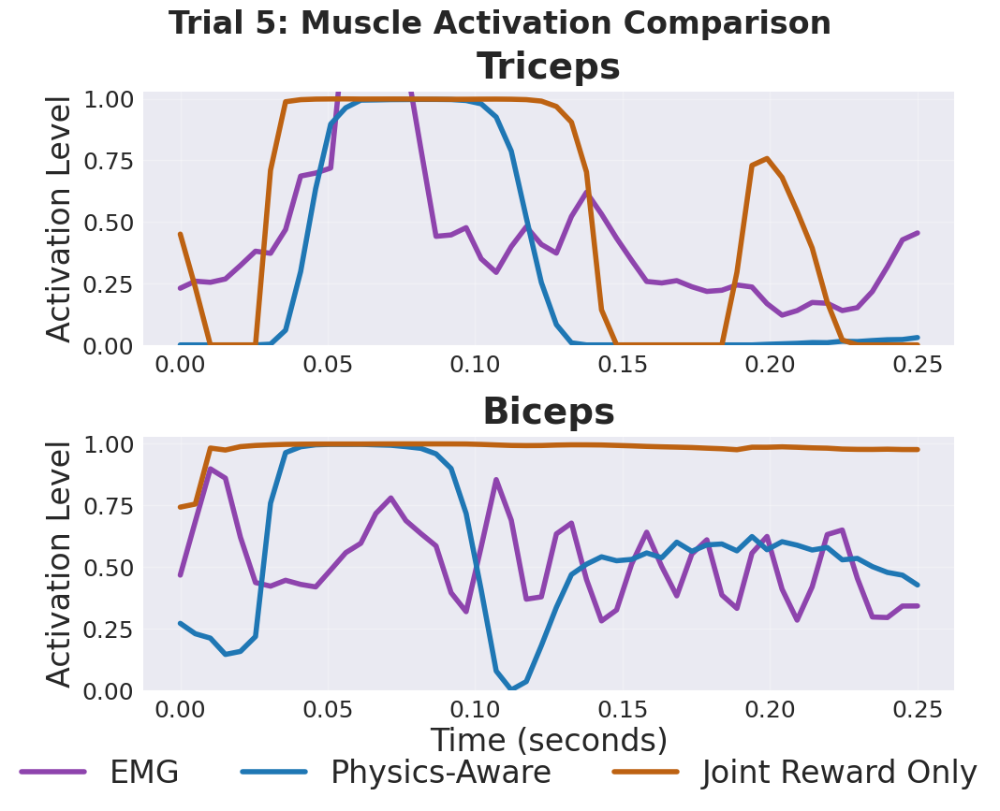

Creating plot for Trial 6...


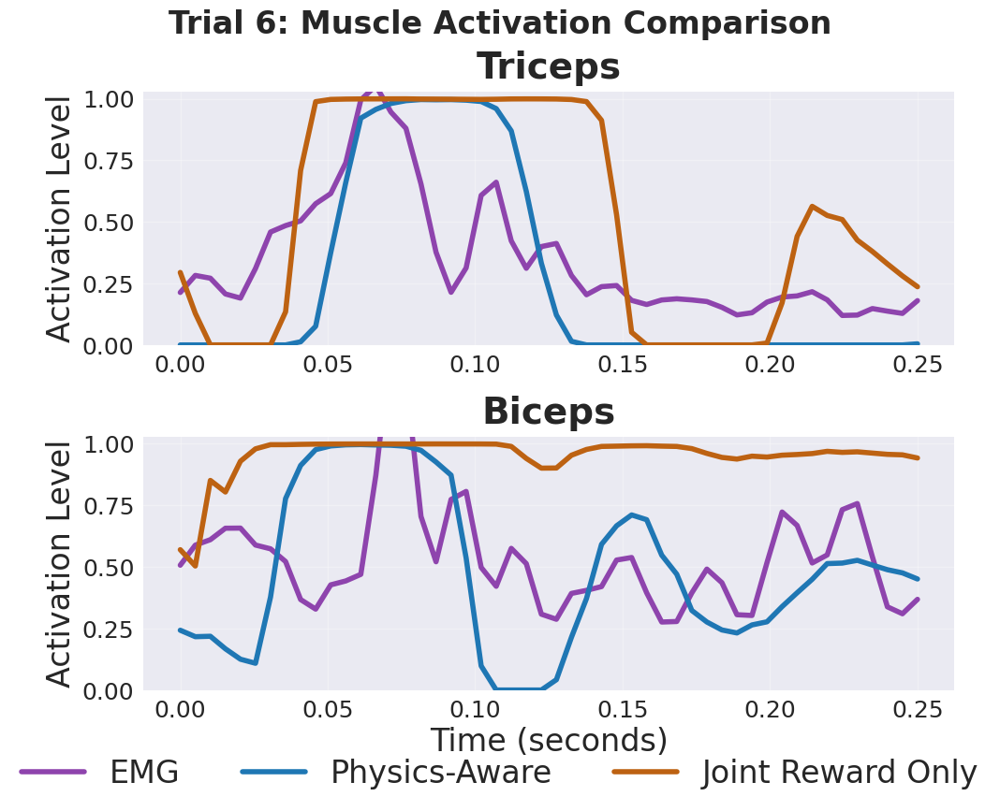

Creating plot for Trial 7...


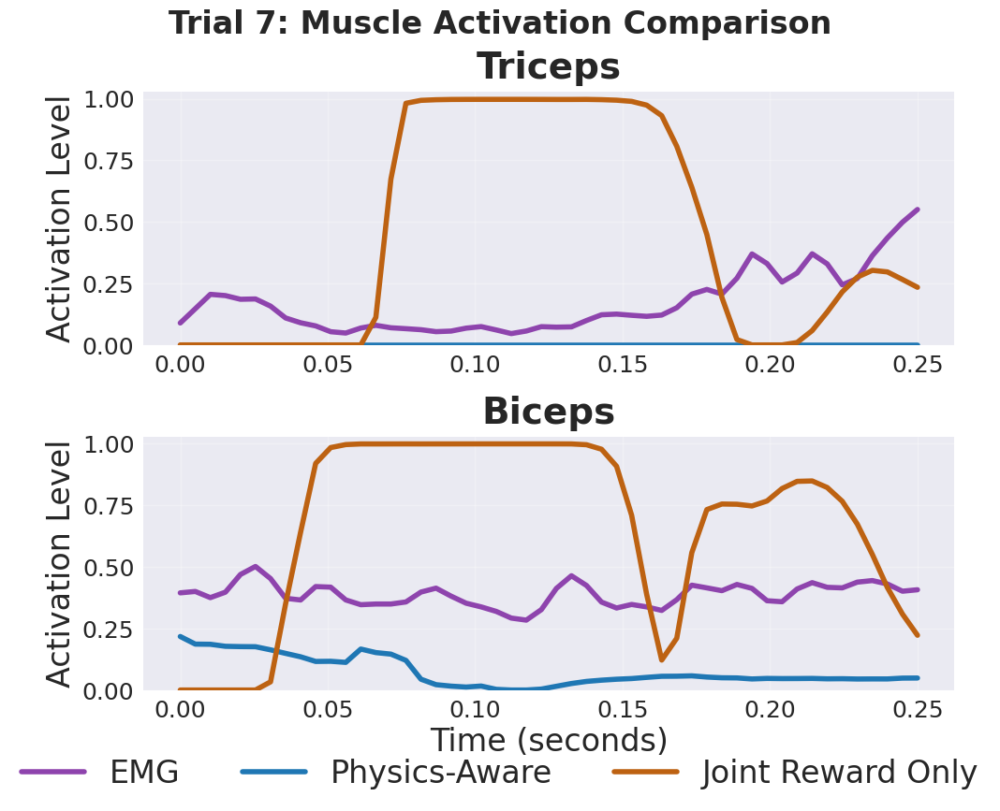

Creating plot for Trial 8...


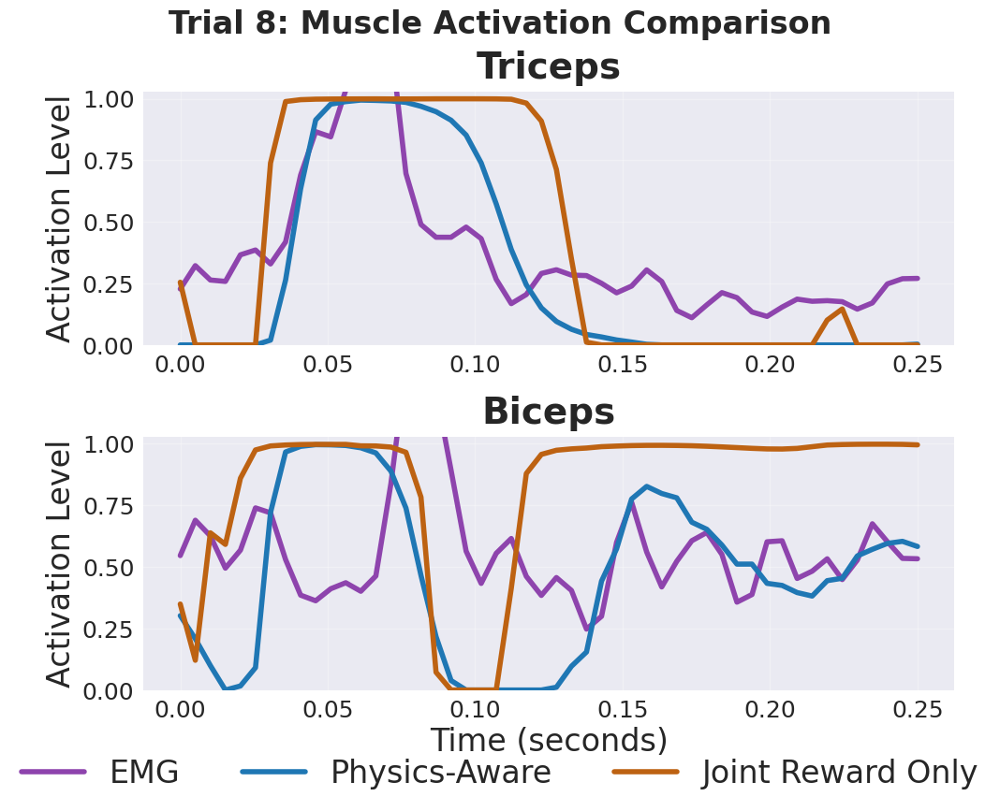

Creating plot for Trial 9...


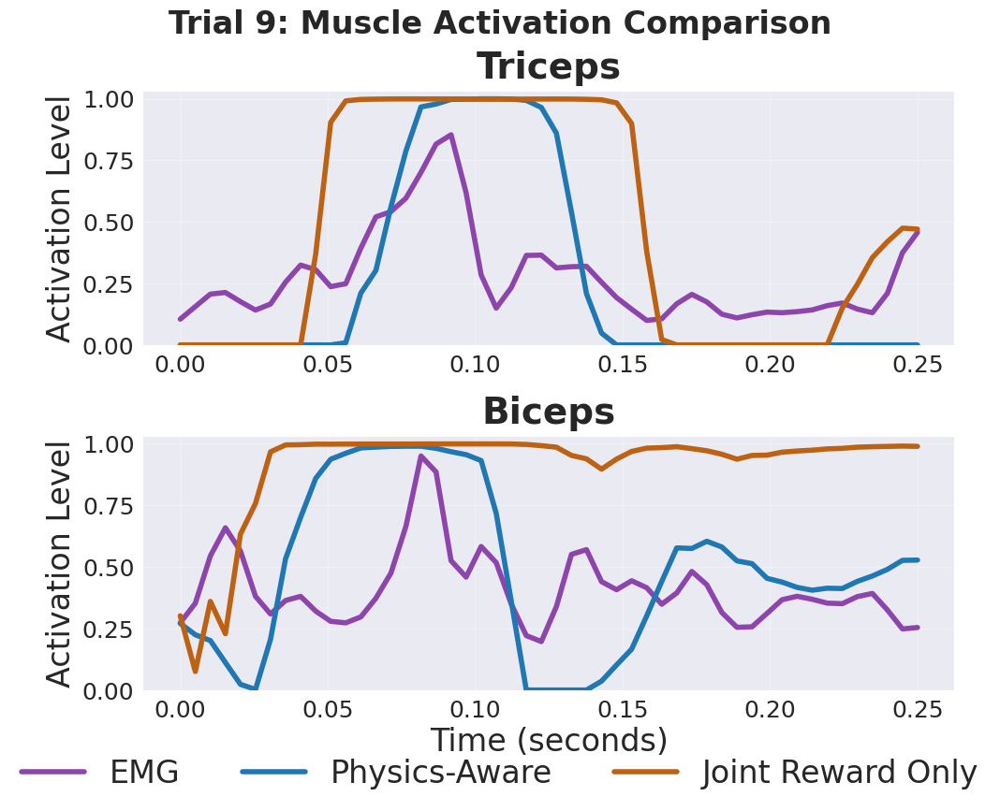

Creating plot for Trial 10...


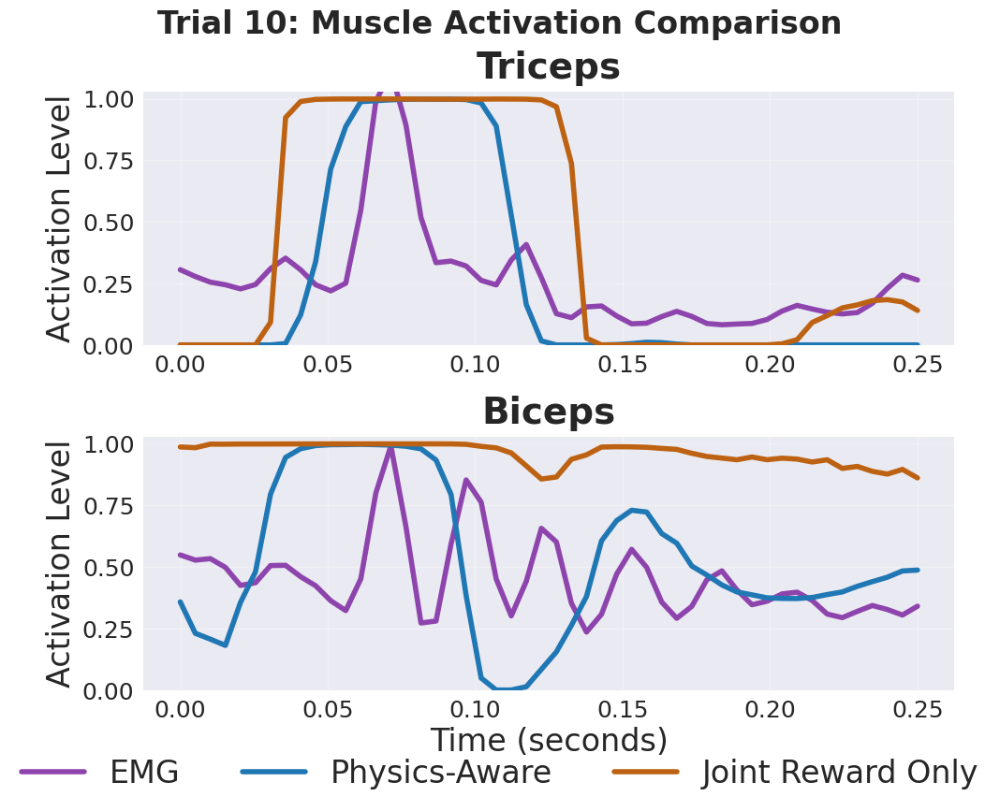

Creating plot for Trial 11...


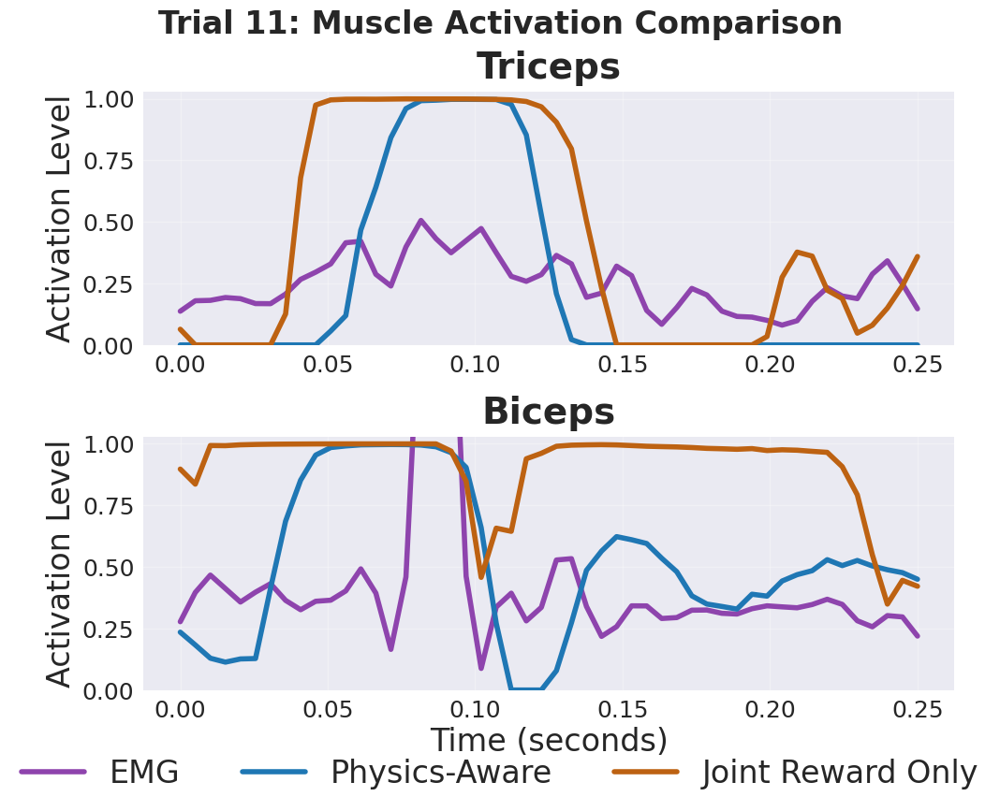

Creating plot for Trial 12...


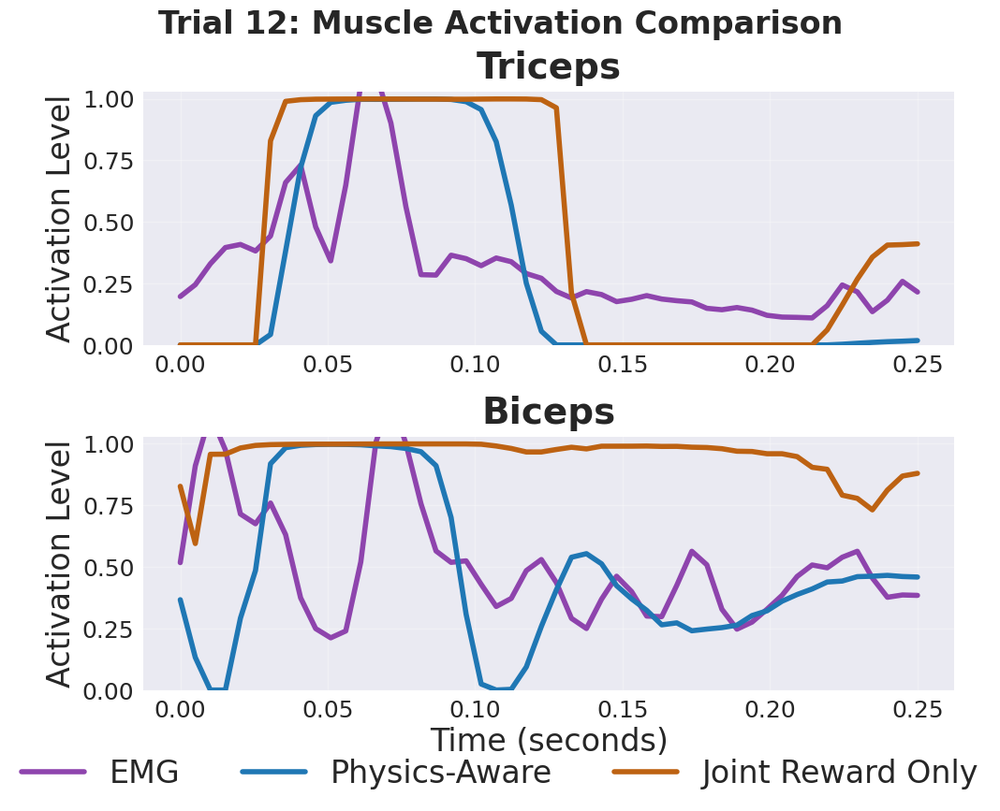

Creating plot for Trial 13...


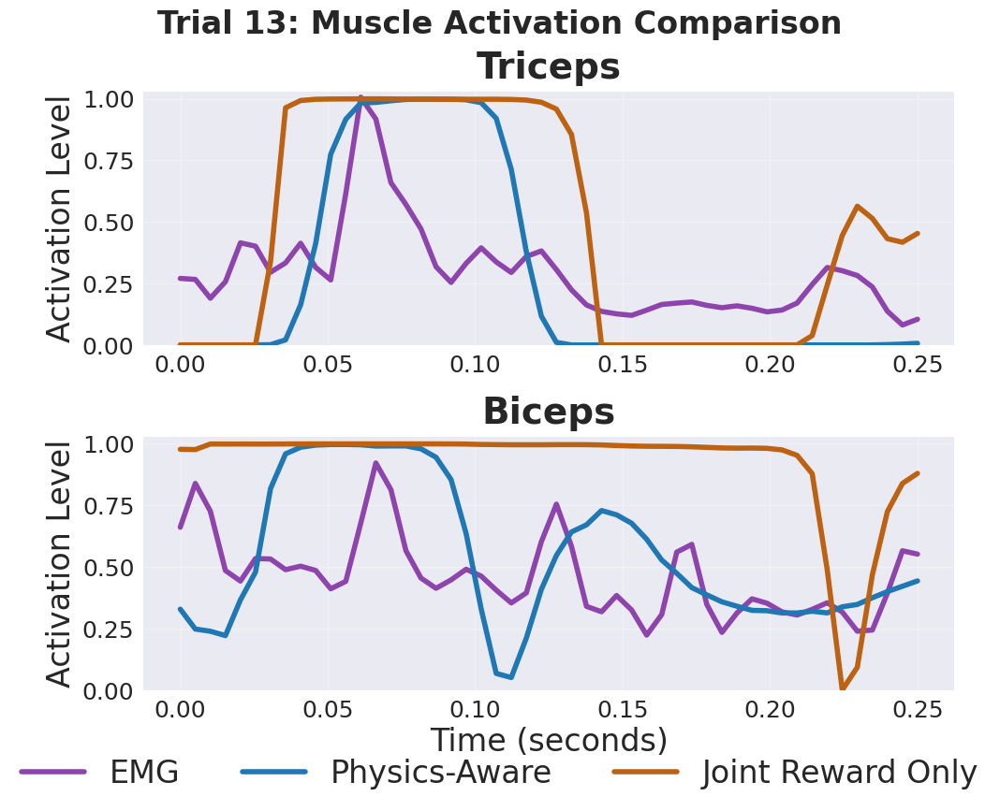

Creating plot for Trial 14...


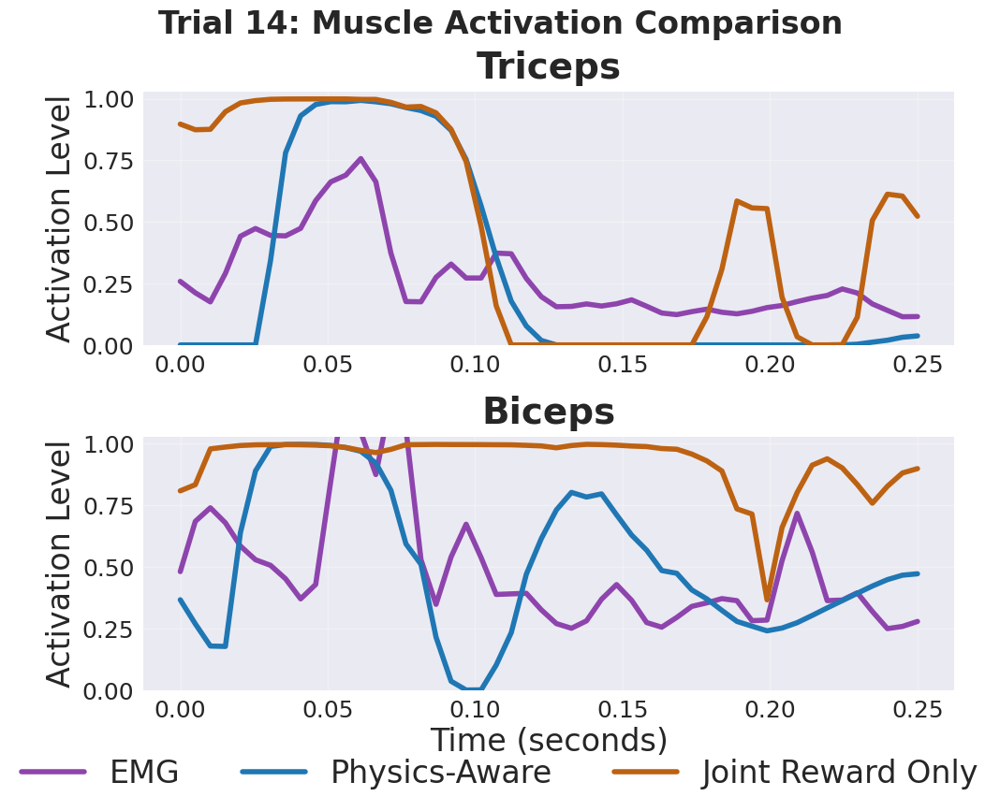

Creating plot for Trial 15...


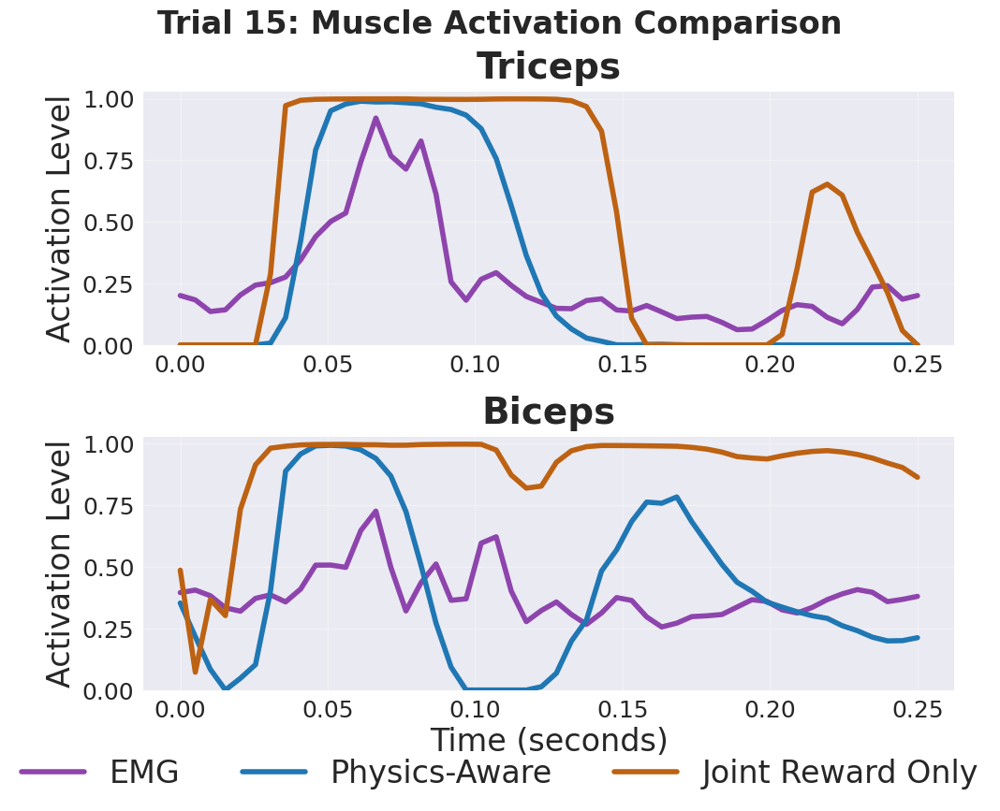

Creating plot for Trial 16...


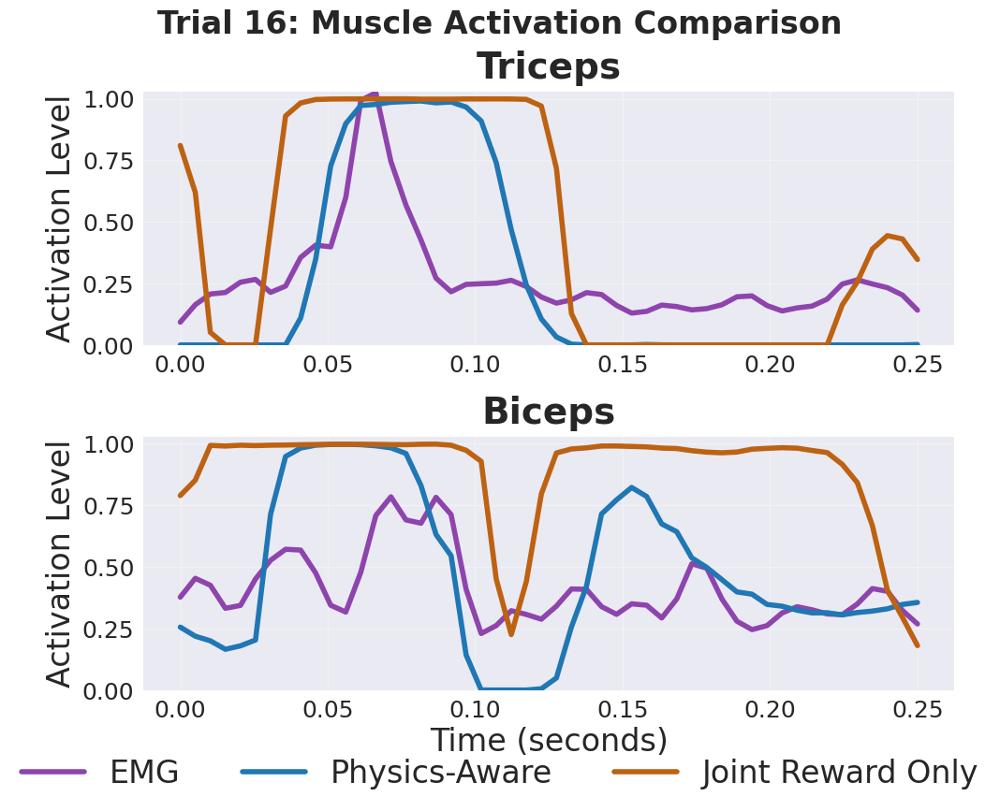

Creating plot for Trial 17...


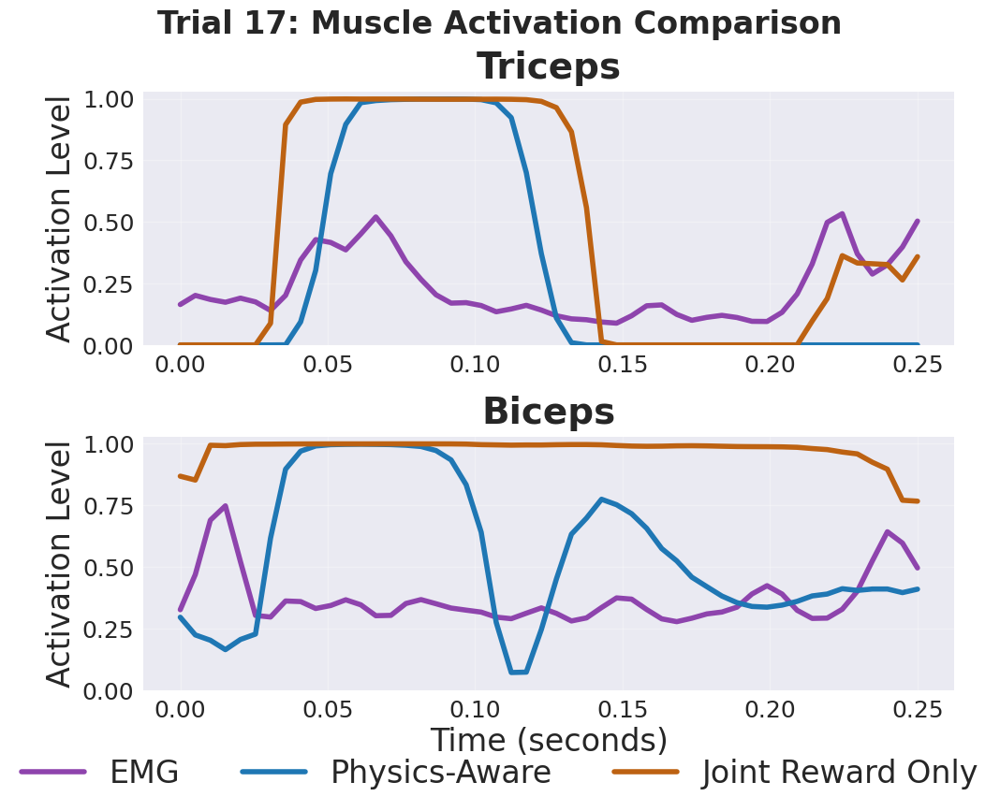

Creating plot for Trial 18...


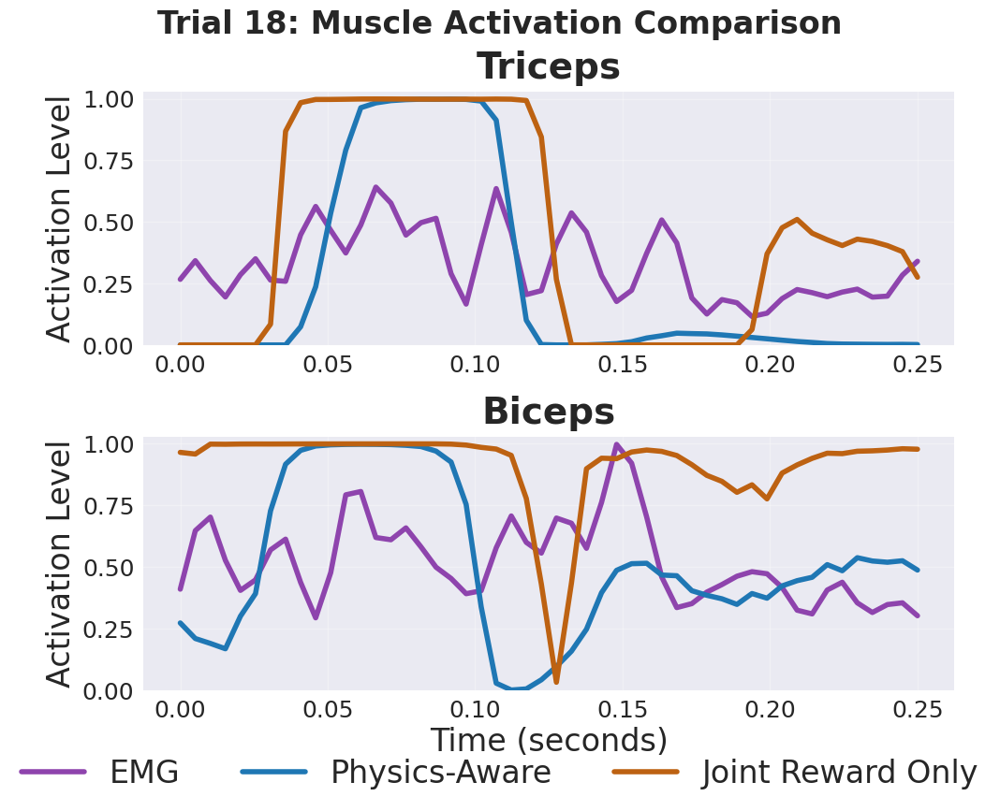

Creating plot for Trial 19...


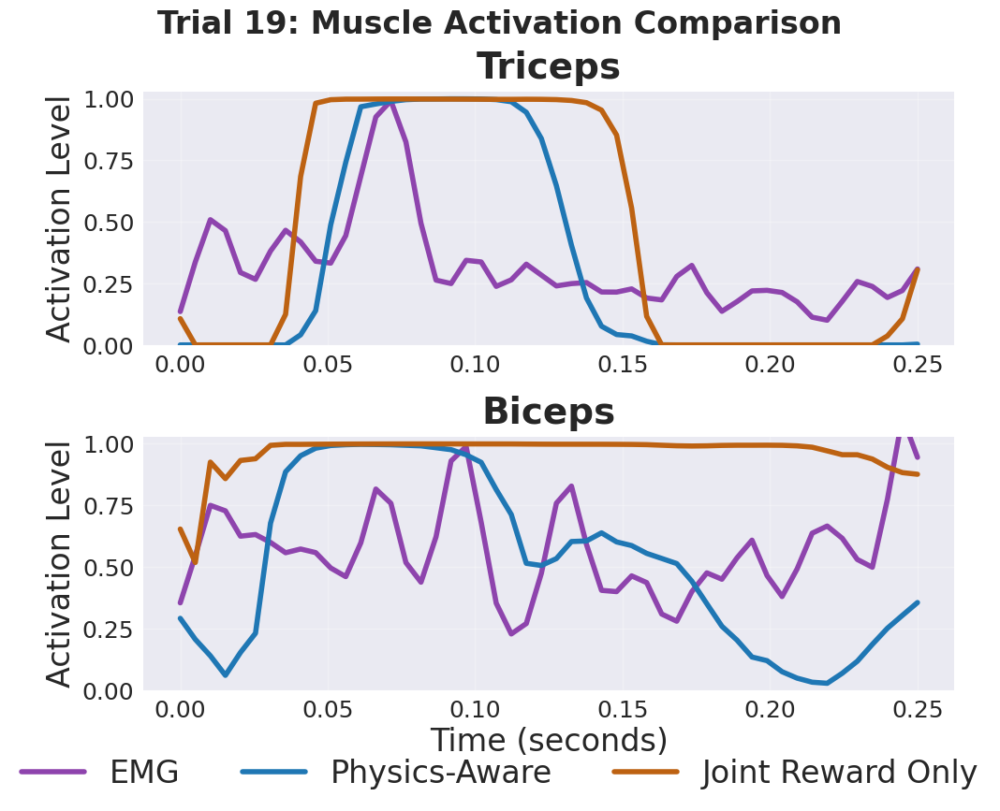

Creating plot for Trial 20...


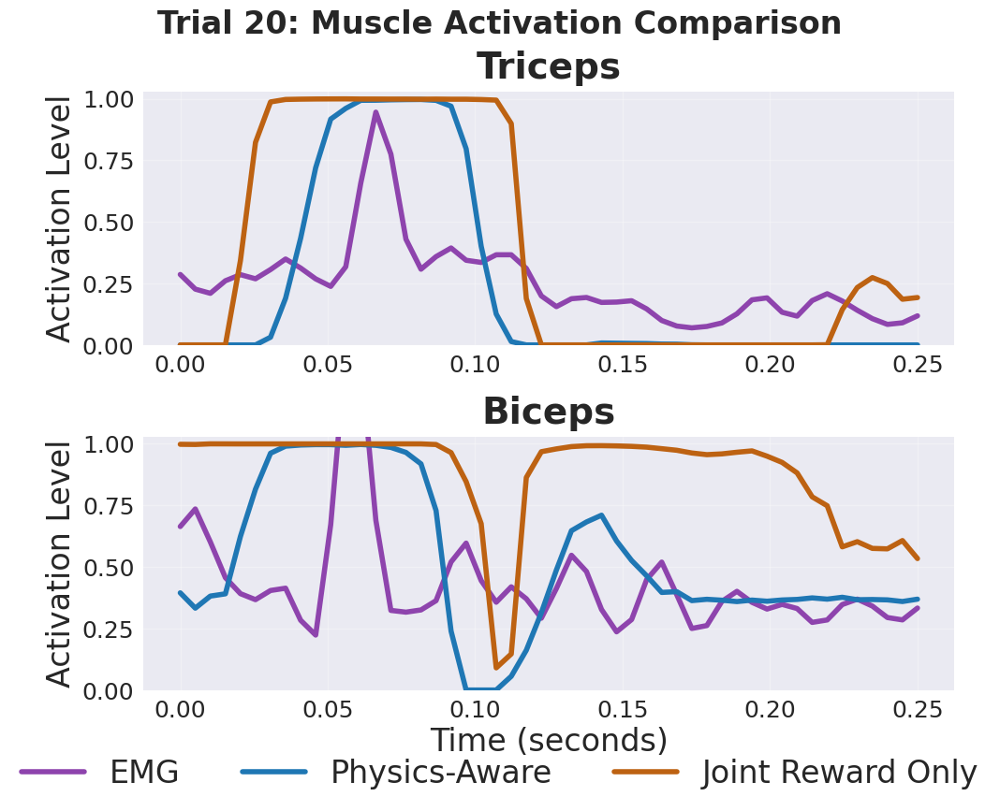

Creating plot for Trial 21...


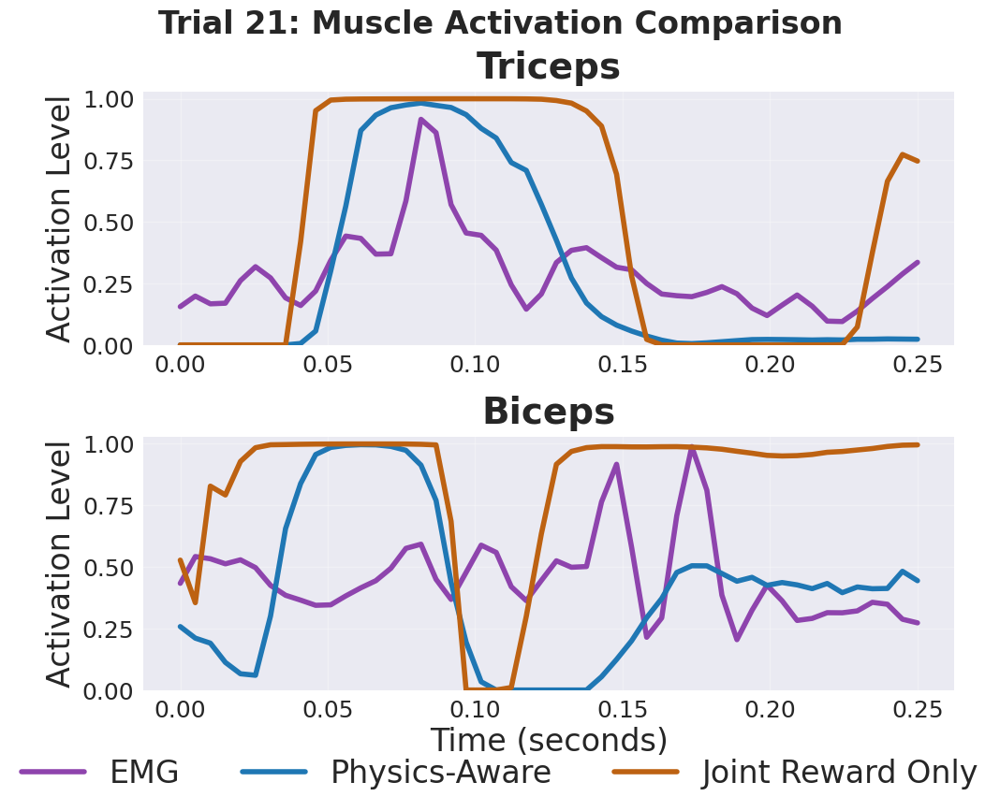

Creating plot for Trial 22...


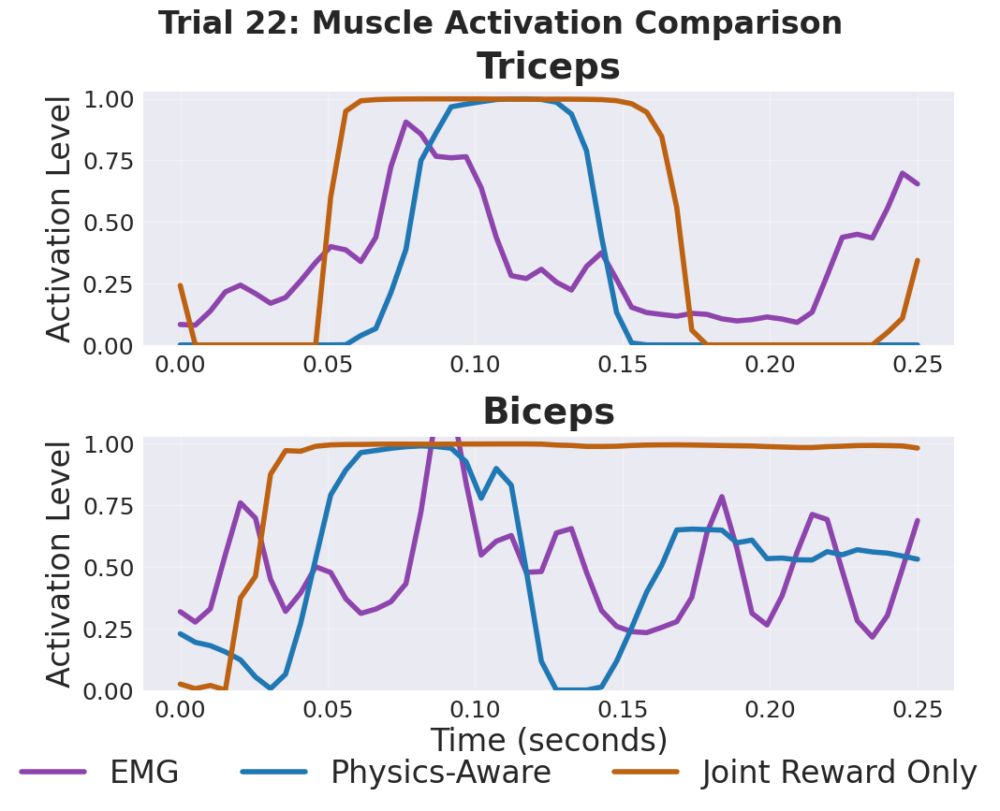

Creating plot for Trial 23...


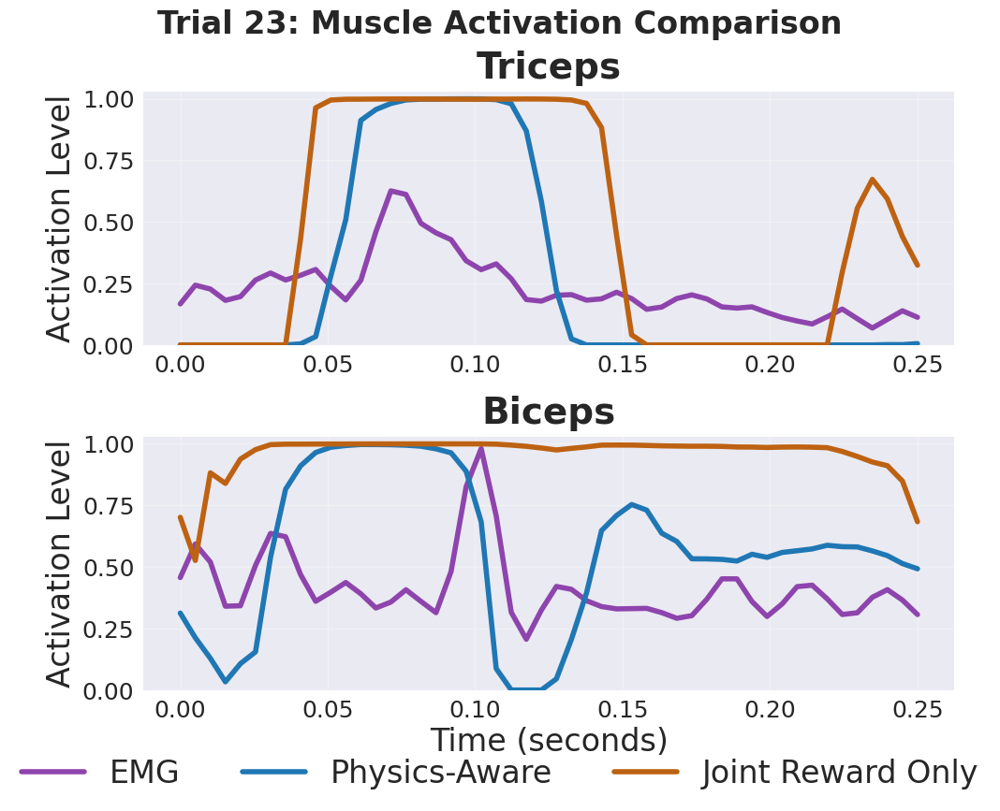

Creating plot for Trial 24...


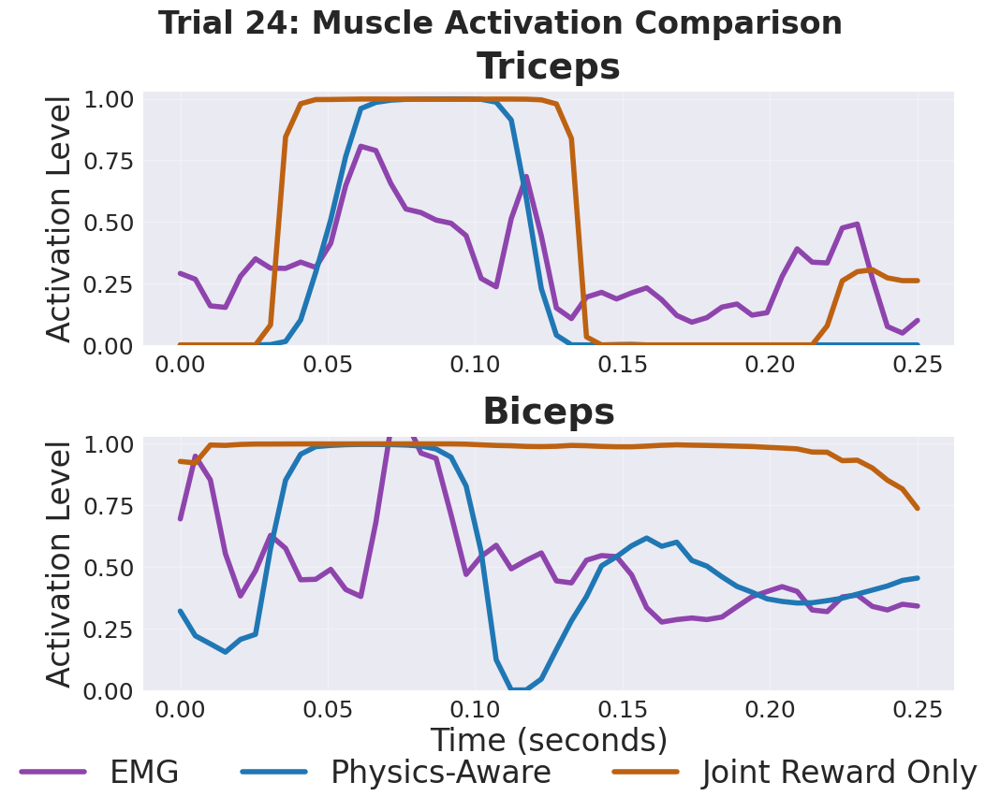

Creating plot for Trial 25...


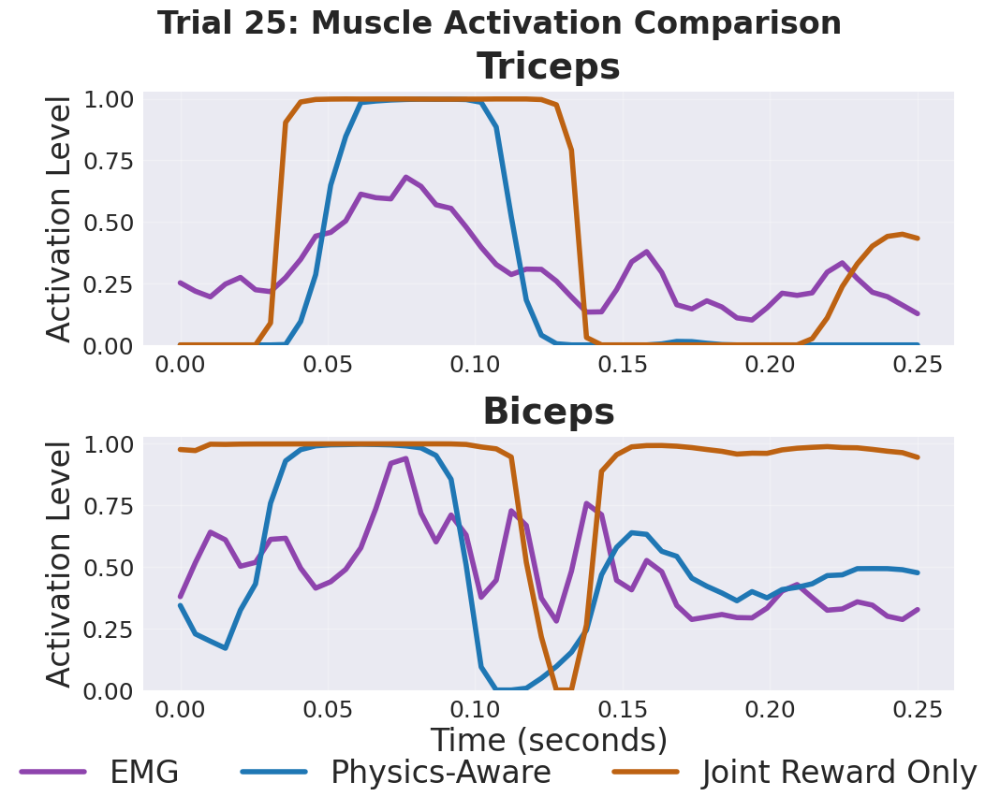

Creating plot for Trial 26...


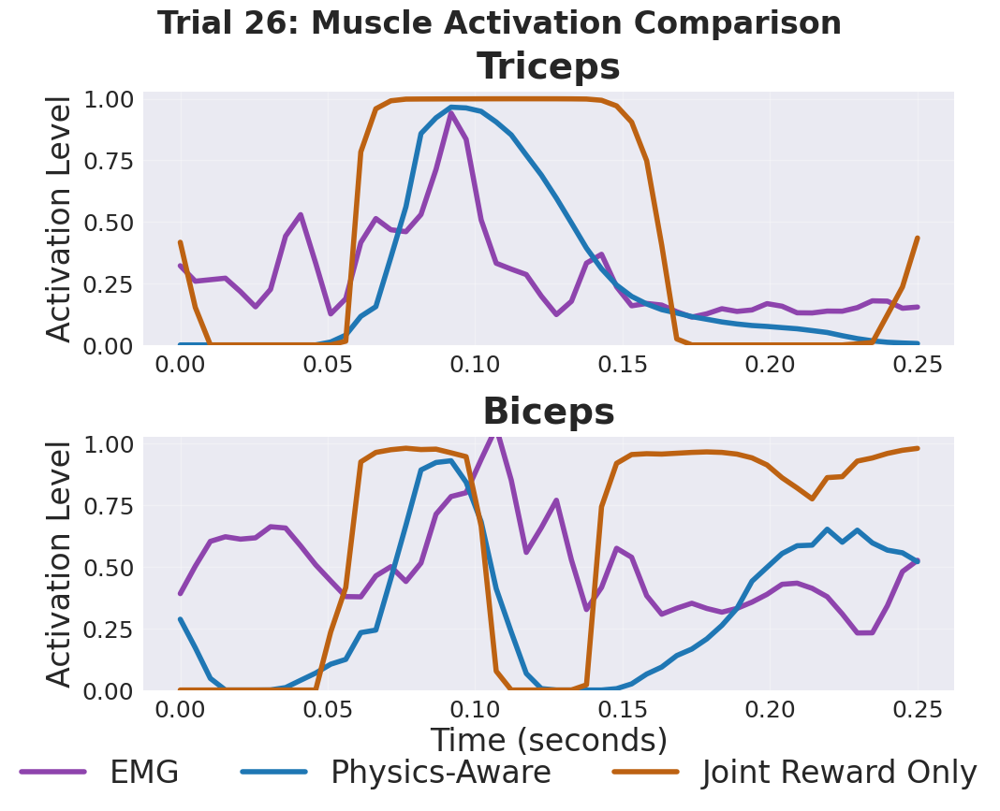

Creating plot for Trial 27...


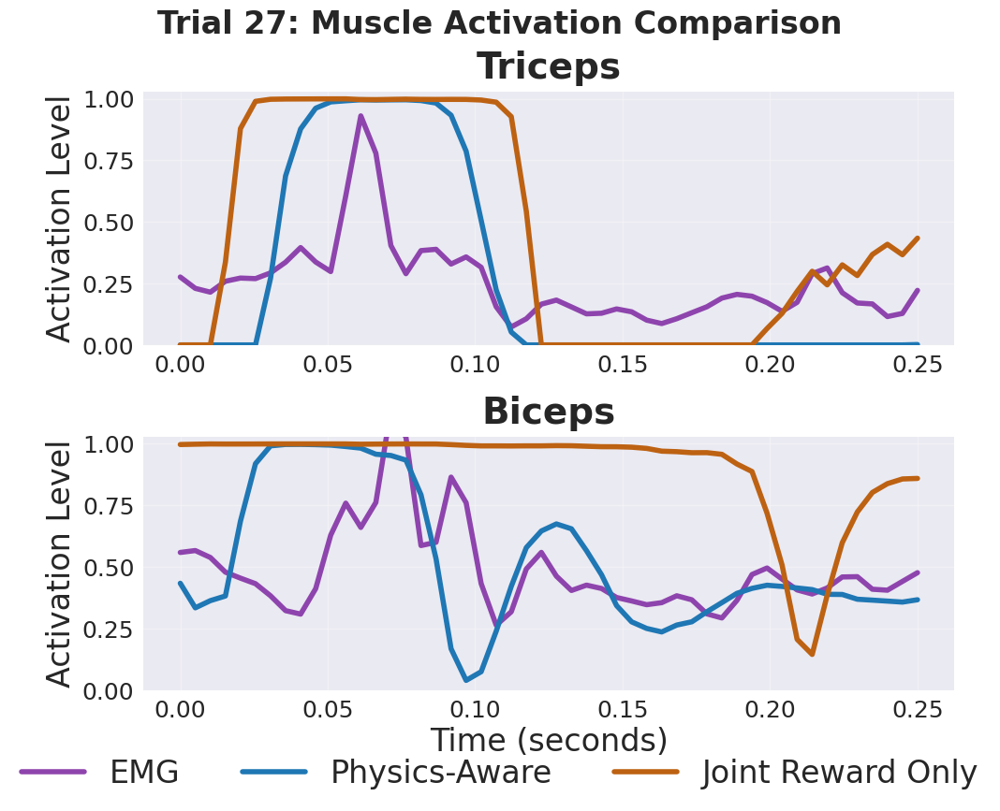

Creating plot for Trial 28...


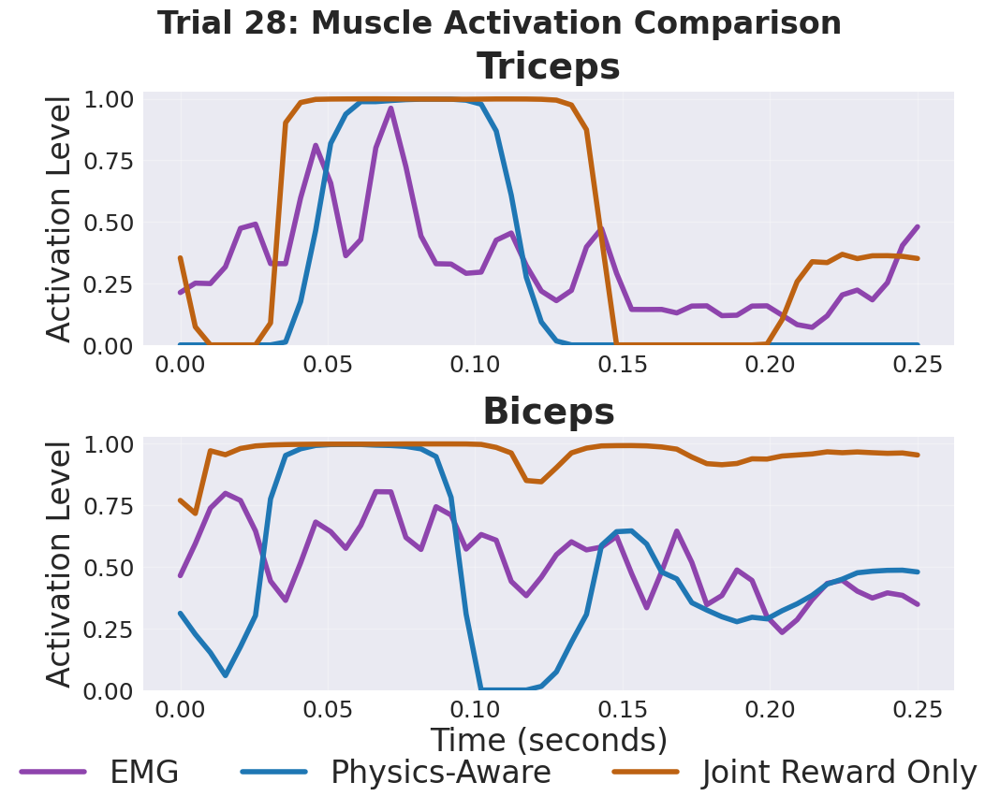

Creating plot for Trial 29...


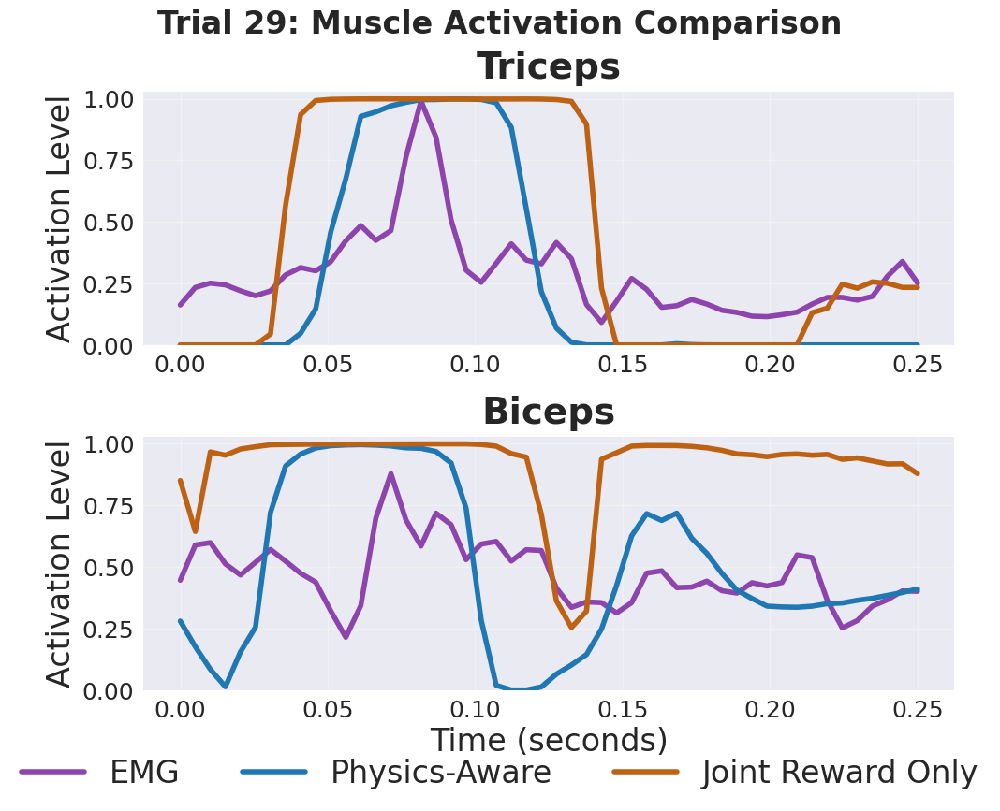

Creating plot for Trial 30...


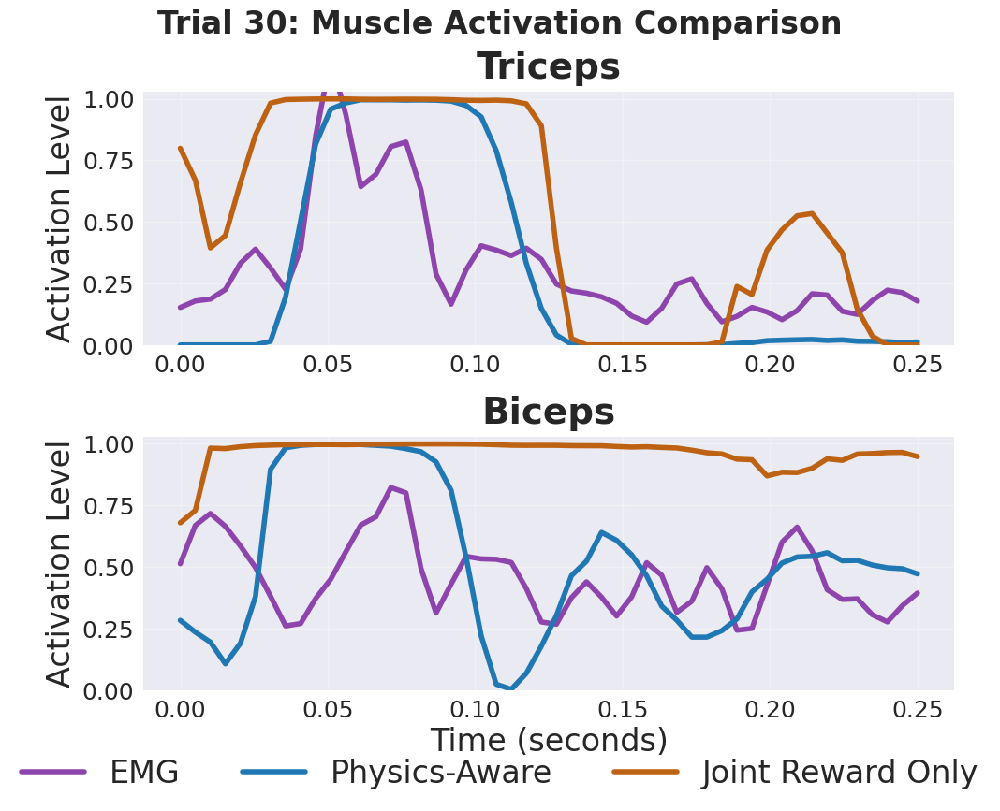

Creating plot for Trial 31...


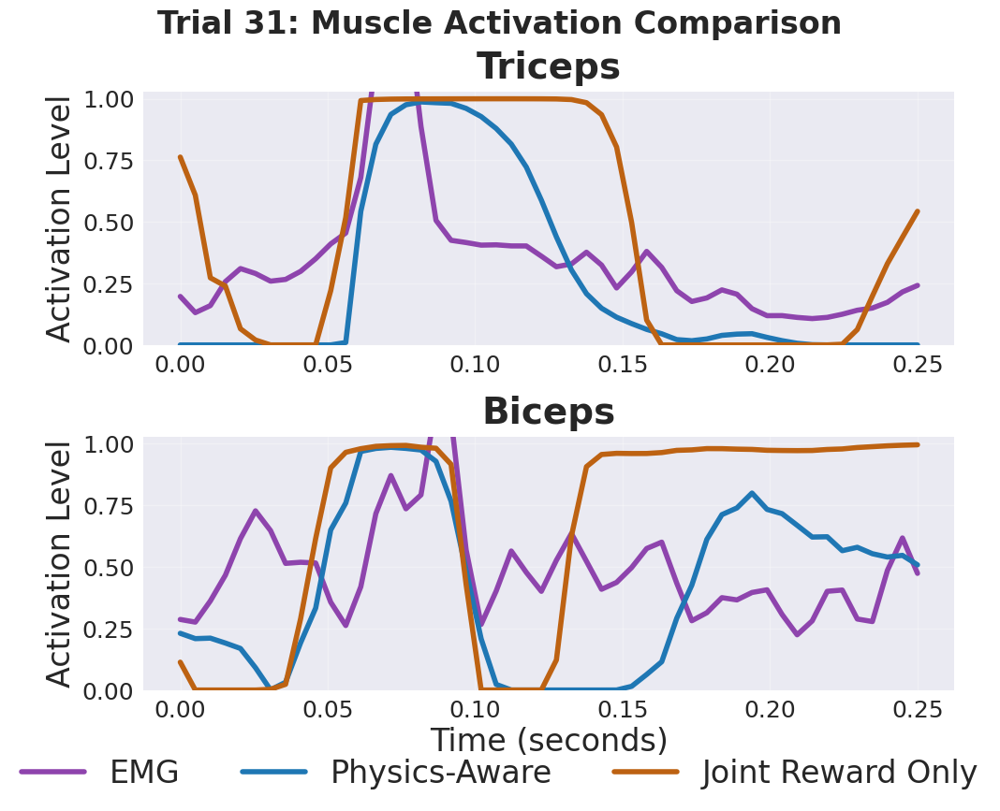

Creating plot for Trial 32...


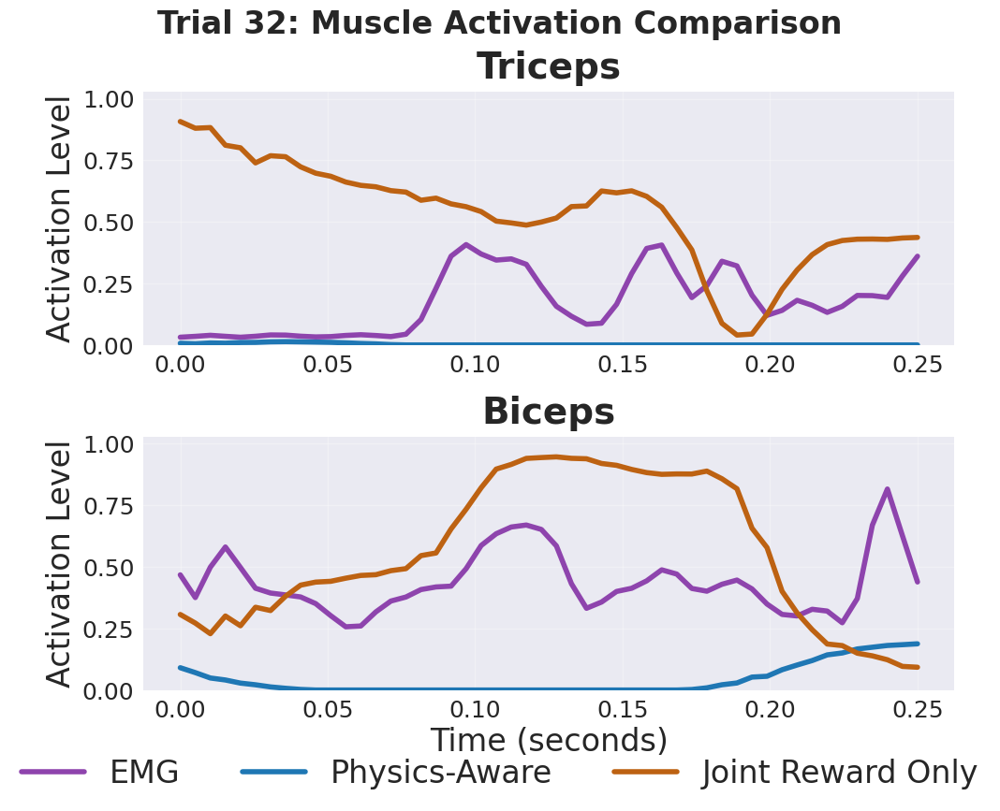

Creating plot for Trial 33...


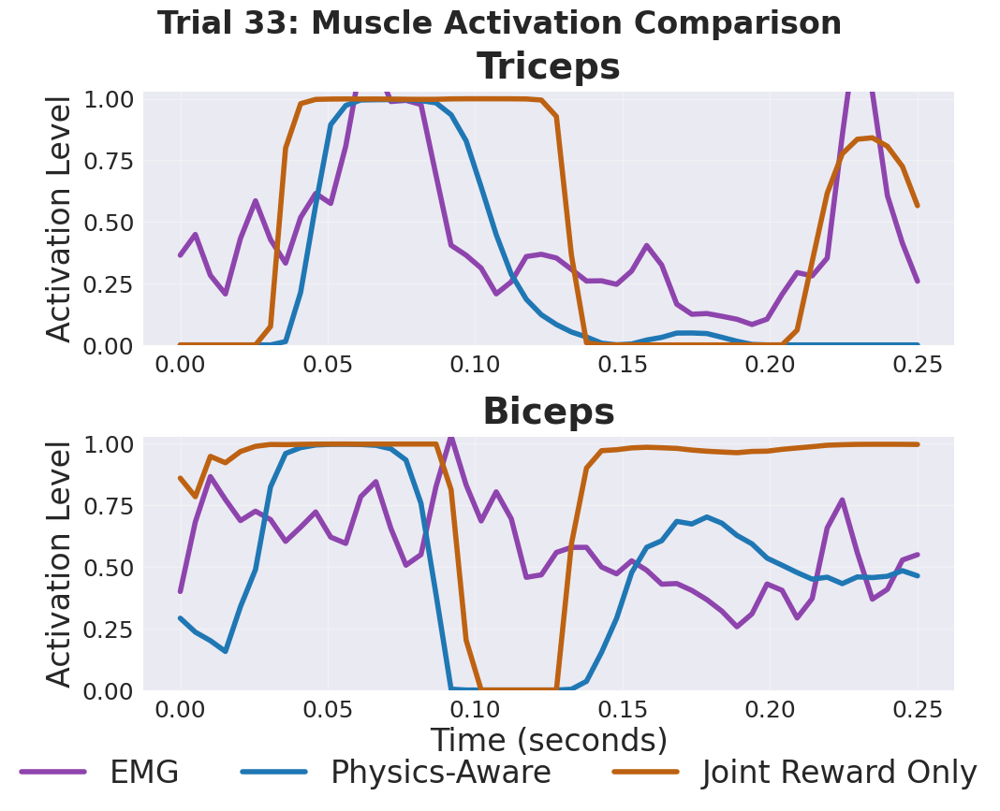

Creating plot for Trial 34...


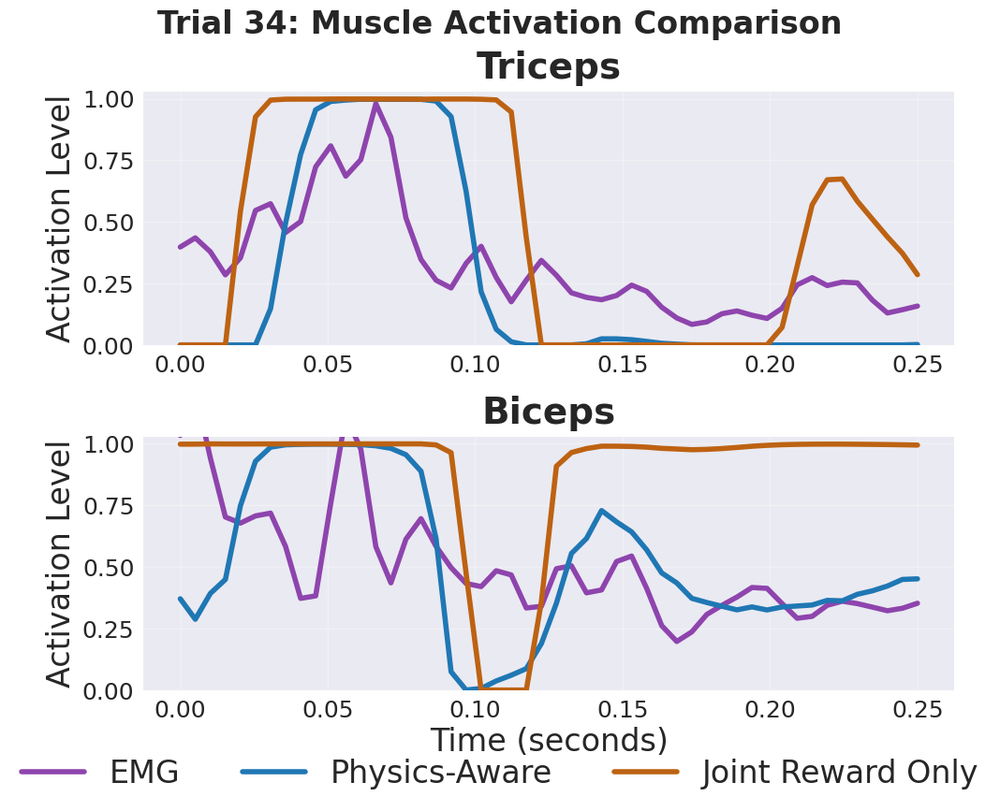

Creating plot for Trial 35...


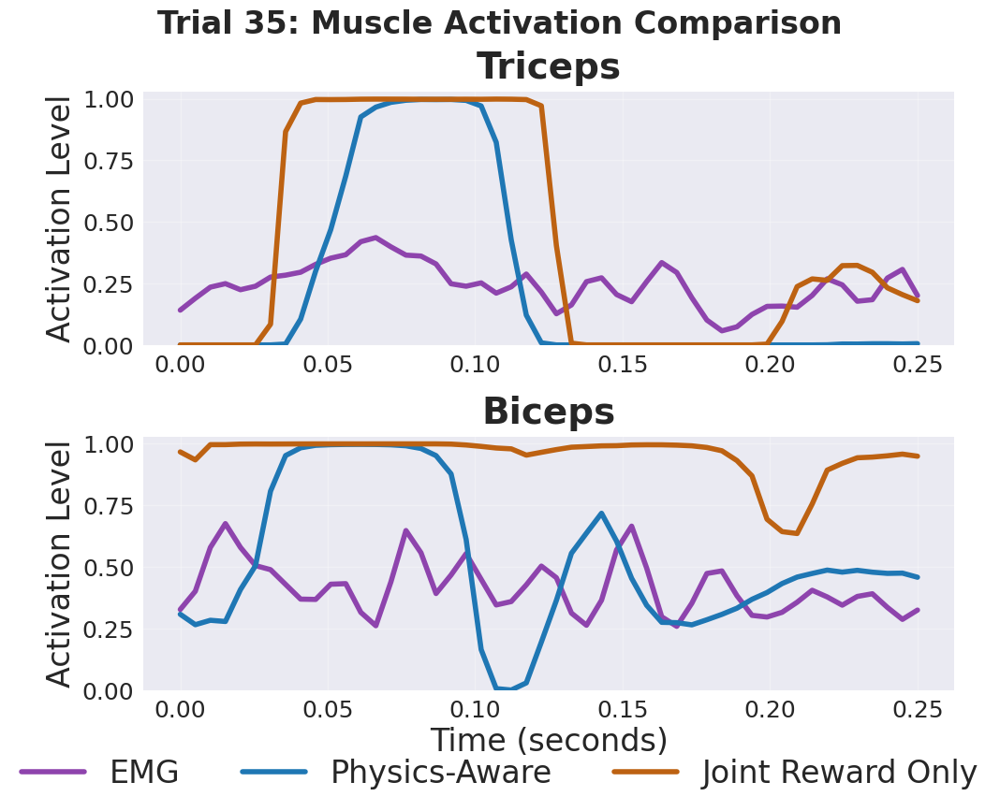

Creating plot for Trial 36...


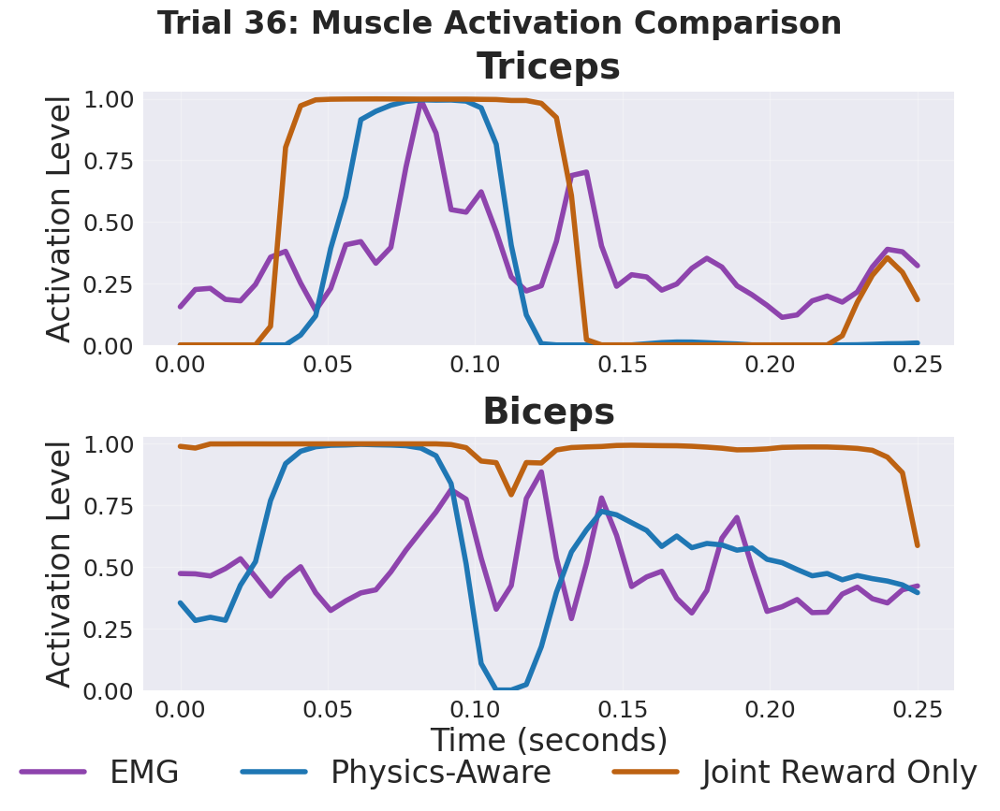

Creating plot for Trial 37...


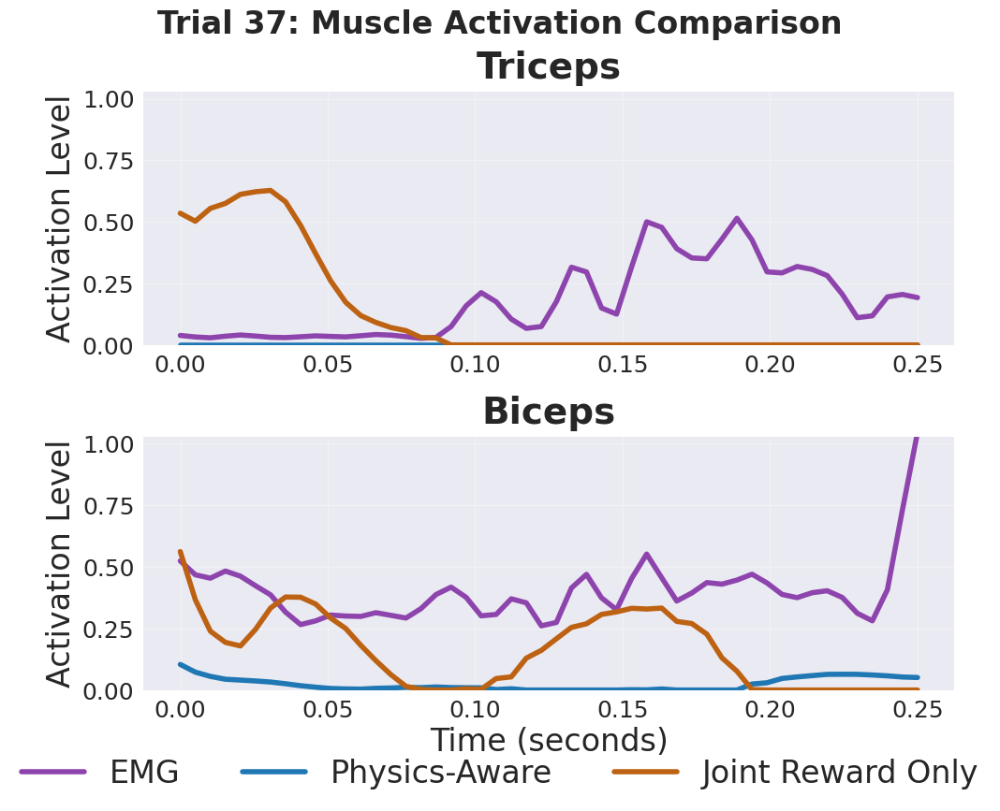

Creating plot for Trial 38...


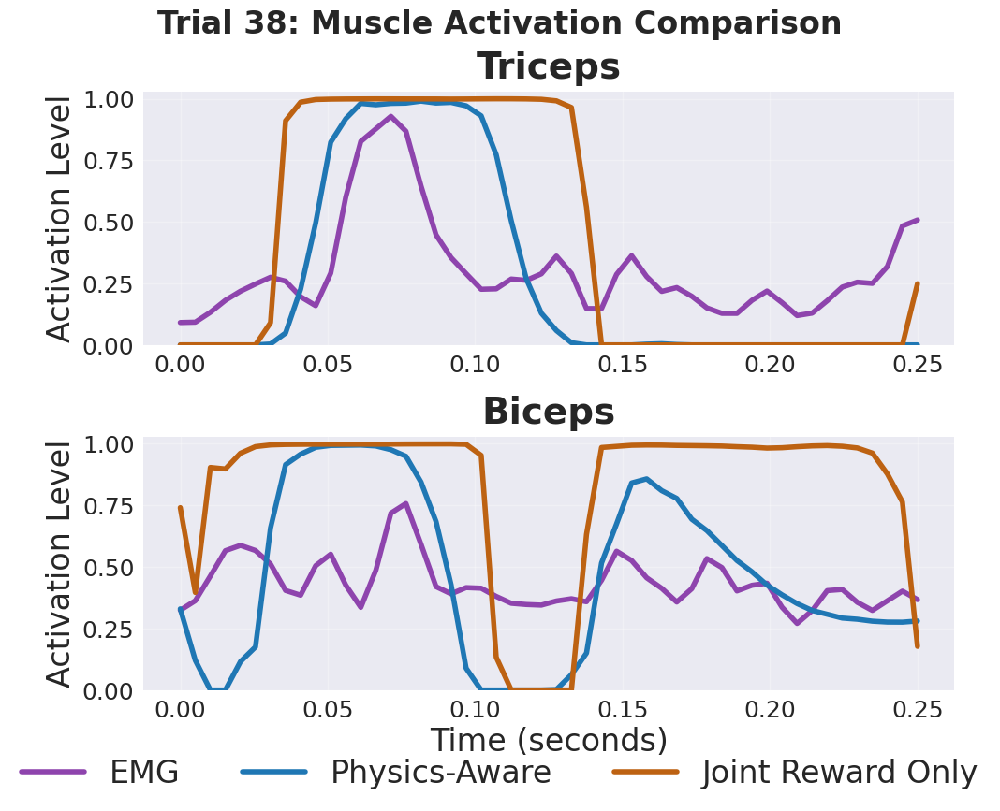

Creating plot for Trial 39...


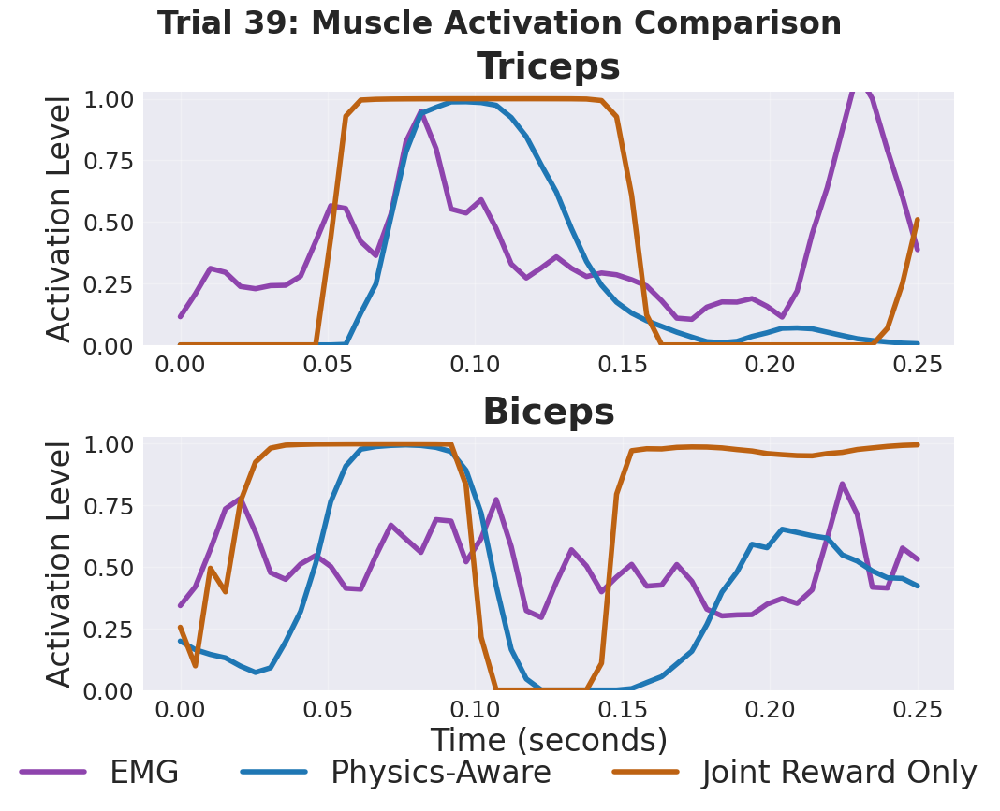

Creating plot for Trial 40...


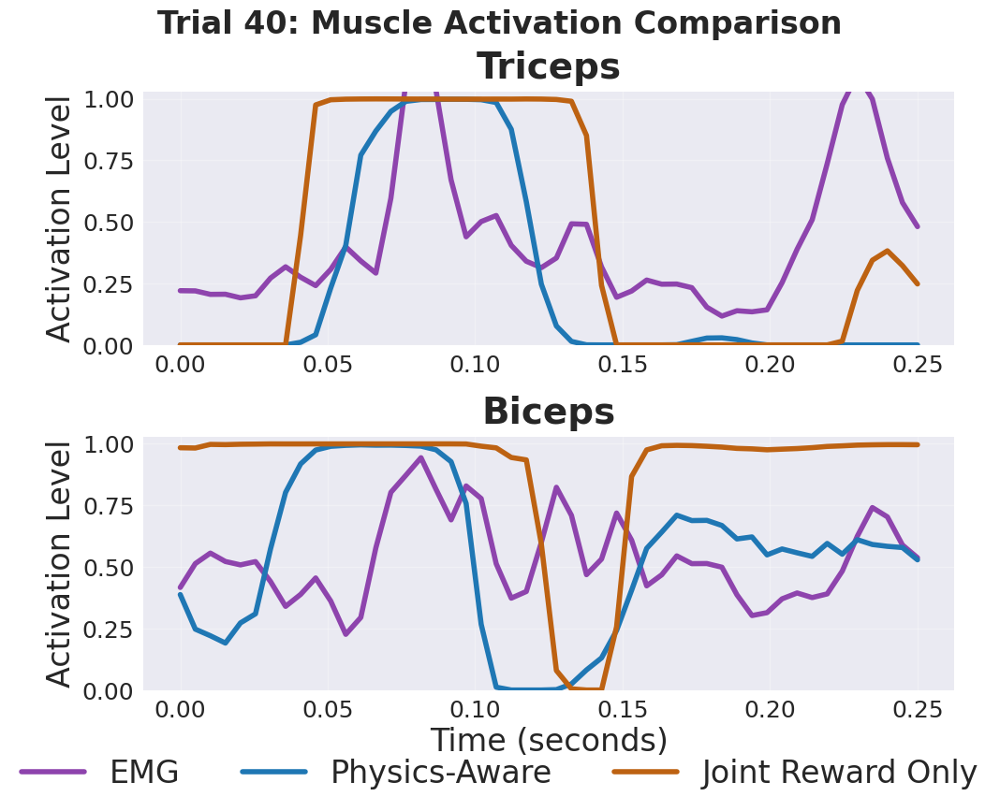

Creating plot for Trial 41...


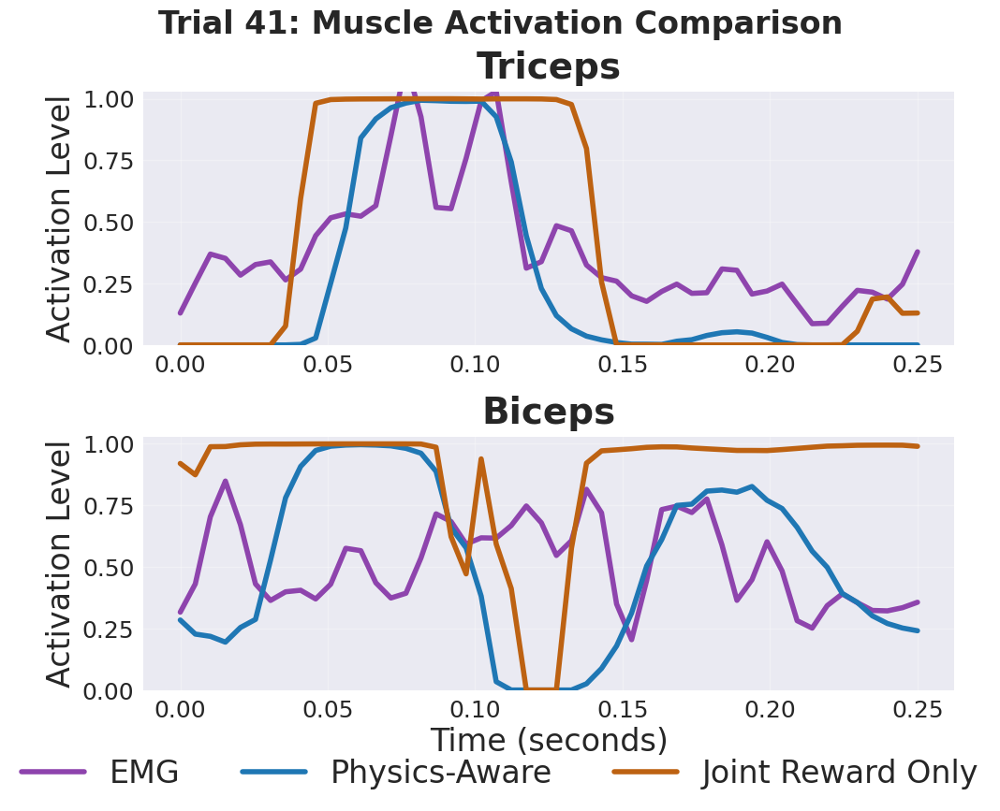

Creating plot for Trial 42...


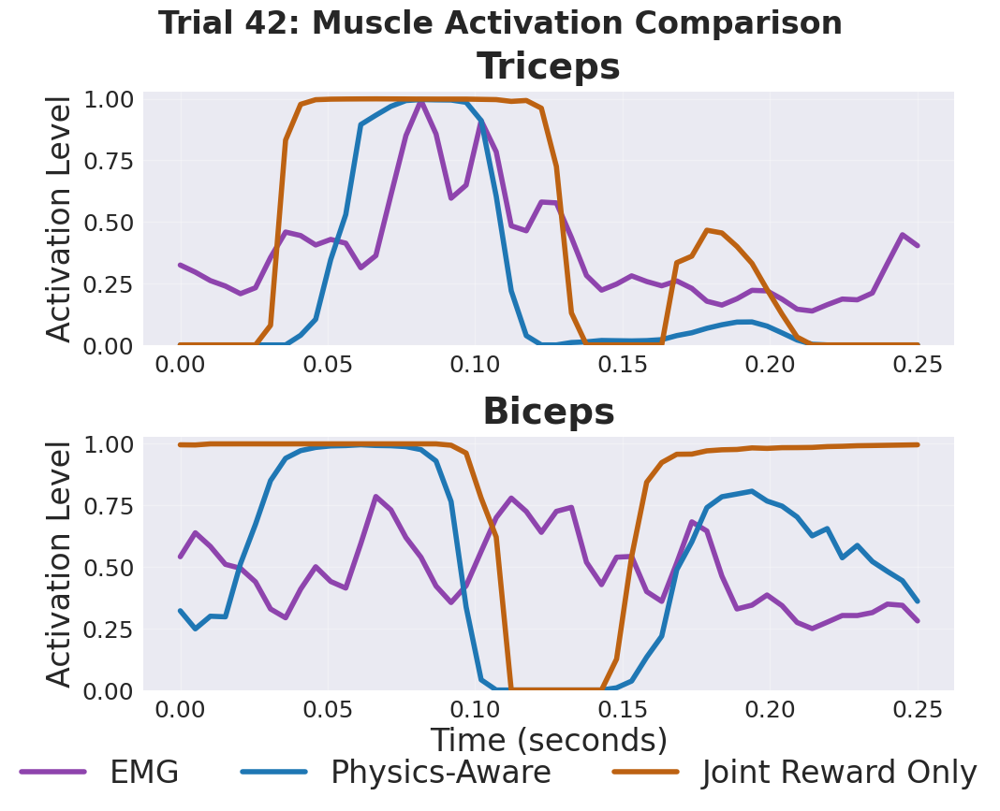

Creating plot for Trial 43...


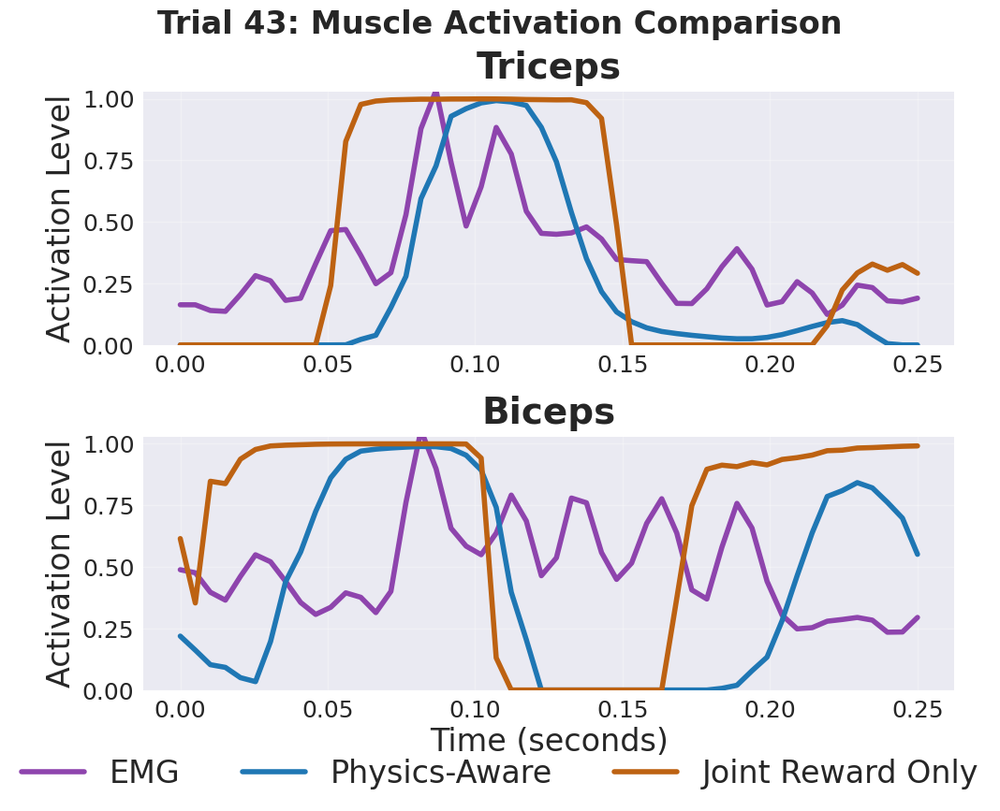

Creating plot for Trial 44...


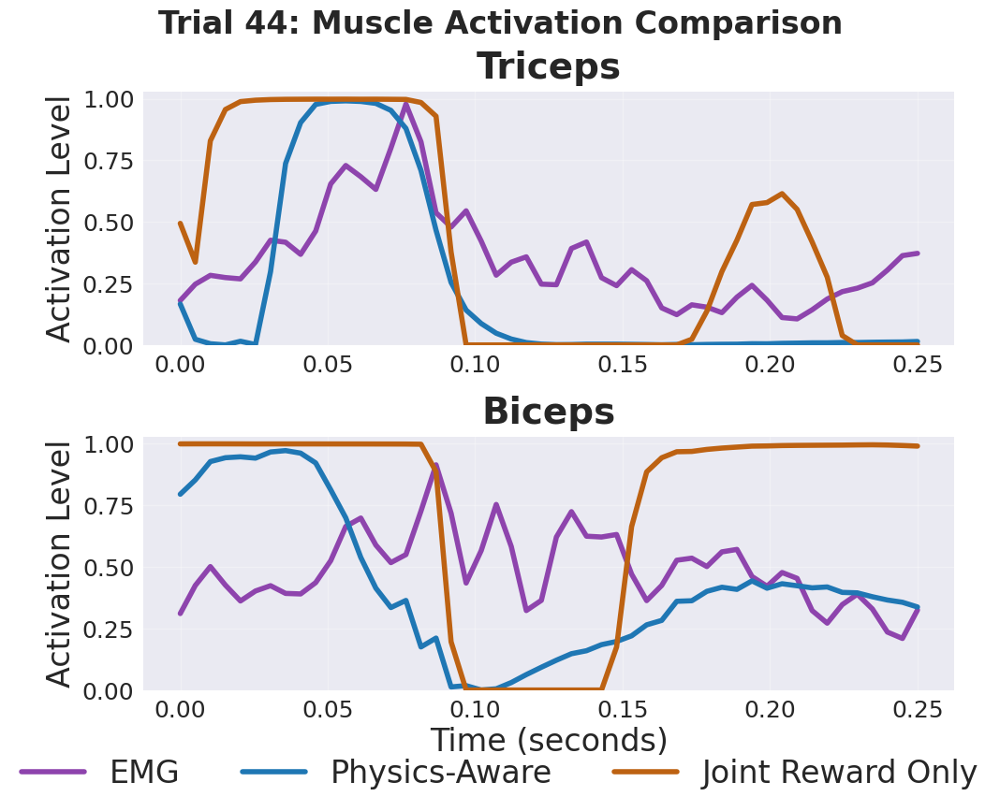

Creating plot for Trial 45...


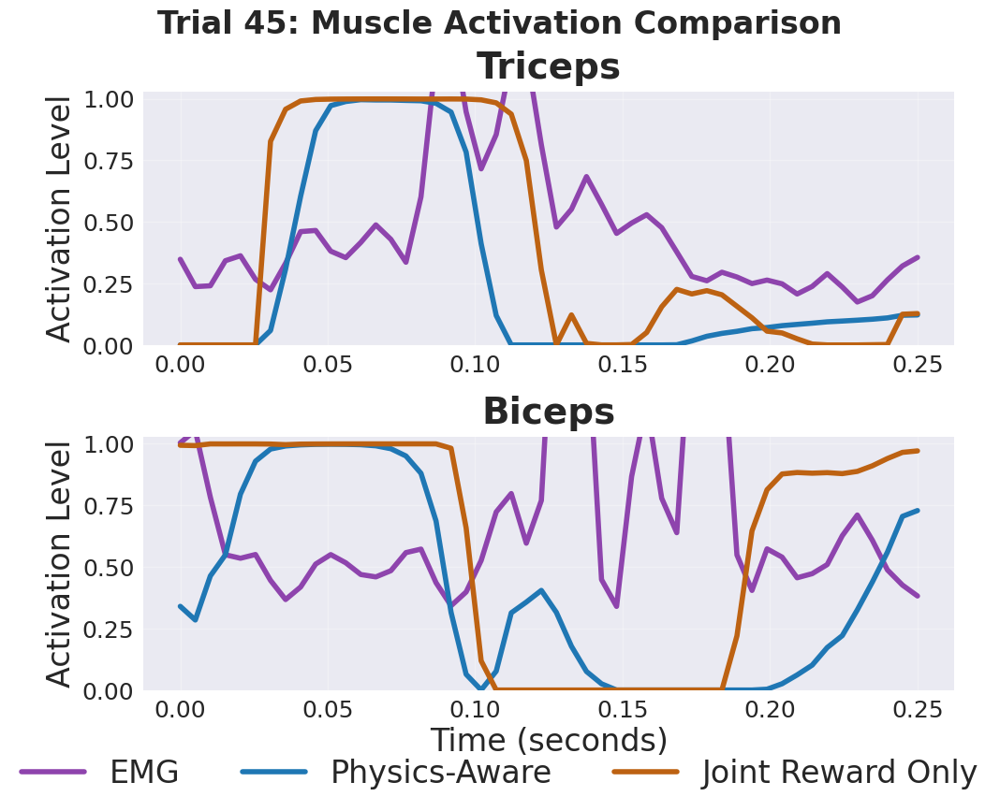

Creating plot for Trial 46...


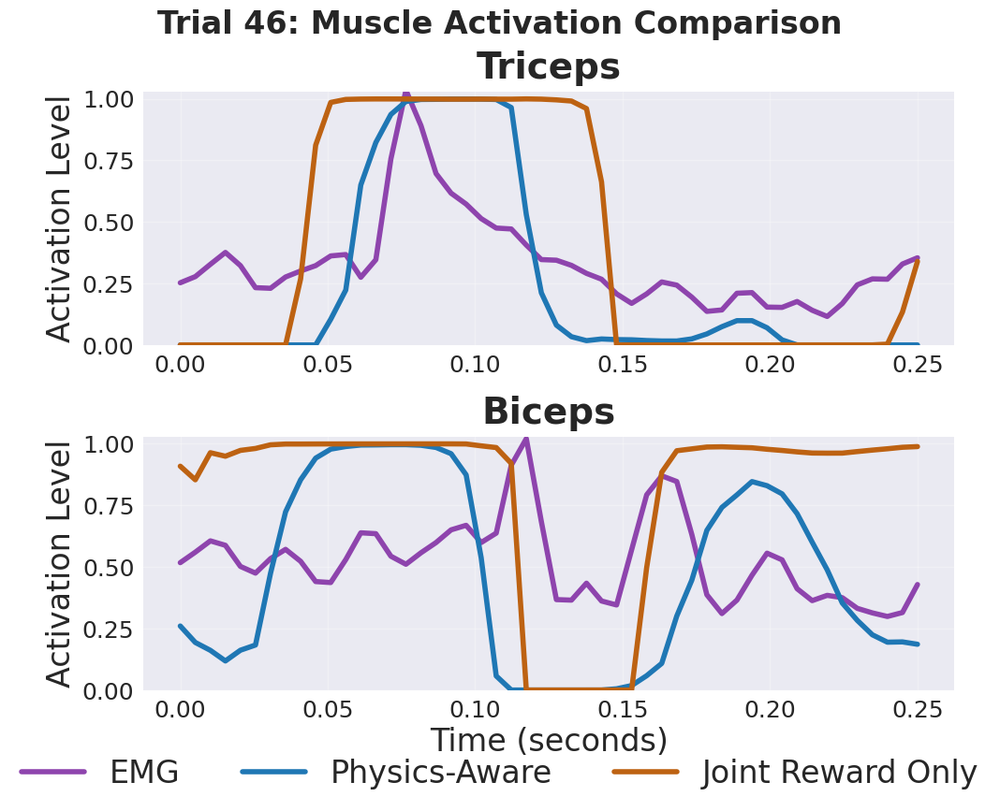

In [11]:
# Extract simulation data (first 250ms)
actions = np.clip(batch_rollout["ctrl"], 0.0, 1.0)
n_clips, T, _ = actions.shape

# Only use first 250ms (half the timesteps)
T_half = T // 2
actions = actions[:, :T_half, :]
target_timesteps = 50  # Target 50 timesteps for 250ms at 200 Hz

# Resample to target timesteps if needed
if T_half != target_timesteps:
    print(f"Resampling from {T_half} to {target_timesteps} timesteps")
    original_time = np.linspace(0, 1, T_half)
    target_time = np.linspace(0, 1, target_timesteps)
    
    resampled_actions = np.zeros((n_clips, target_timesteps, actions.shape[2]))
    for clip_idx in range(n_clips):
        for muscle_idx in range(actions.shape[2]):
            f = interp1d(original_time, actions[clip_idx, :, muscle_idx], kind='linear')
            resampled_actions[clip_idx, :, muscle_idx] = f(target_time)
    actions = resampled_actions

time_axis = np.linspace(0, 0.25, target_timesteps)

# Extract Joint Reward Only model data (first 250ms)
print("Processing Joint Reward Only model data...")
joint_actions = np.clip(joint_batch_rollout["ctrl"], 0.0, 1.0)
n_clips_joint, T_joint_full, _ = joint_actions.shape
print(f"Joint Reward Only actions shape: {joint_actions.shape}")

# Only use first 250ms (half the timesteps)
T_joint = T_joint_full // 2
joint_actions = joint_actions[:, :T_joint, :]

# Resample to target timesteps if needed
if T_joint != target_timesteps:
    print(f"Resampling Joint Reward Only from {T_joint} to {target_timesteps} timesteps")
    original_time = np.linspace(0, 1, T_joint)
    target_time = np.linspace(0, 1, target_timesteps)
    
    resampled_joint_actions = np.zeros((n_clips_joint, target_timesteps, joint_actions.shape[2]))
    for clip_idx in range(n_clips_joint):
        for muscle_idx in range(joint_actions.shape[2]):
            f = interp1d(original_time, joint_actions[clip_idx, :, muscle_idx], kind='linear')
            resampled_joint_actions[clip_idx, :, muscle_idx] = f(target_time)
    joint_actions = resampled_joint_actions

# Process EMG data for all muscles
print("Processing EMG data...")
emg_data_by_muscle = {}
for sim_muscle_idx, sim_name, emg_file, muscle_name in MUSCLE_CONFIGS:
    print(f"  Processing {muscle_name}...")
    emg_traces = process_emg_data_individual_trials(emg_file, target_timesteps, NUM_TRIALS, duration_ms=250)
    emg_data_by_muscle[muscle_name] = emg_traces

# Create plots for each trial
for trial_idx in range(min(NUM_TRIALS, n_clips)):
    print(f"Creating plot for Trial {trial_idx + 1}...")
    
    # Create figure (2 rows, 1 column)
    fig, axes = plt.subplots(2, 1, figsize=(10, 8))
    
    legend_handles = []
    legend_labels = []
    legend_created = False
    
    for muscle_idx, (sim_muscle_idx, sim_name, emg_file, muscle_name) in enumerate(MUSCLE_CONFIGS):
        ax = axes[muscle_idx]
        
        # Plot EMG trace for this trial
        emg_traces = emg_data_by_muscle[muscle_name]
        if emg_traces is not None and trial_idx < len(emg_traces):
            line = ax.plot(time_axis, emg_traces[trial_idx], 
                          color=colorblind_colors[2], linewidth=4.0, label='EMG')[0]
            if not legend_created:
                legend_handles.append(line)
                legend_labels.append('EMG')
        
        # Plot Physics-Aware model
        if trial_idx < len(actions):
            physics_trace = actions[trial_idx, :, sim_muscle_idx]
            line = ax.plot(time_axis, physics_trace, 
                          color=colorblind_colors[0], linewidth=4.0,
                          label='Physics-Aware')[0]
            if not legend_created:
                legend_handles.append(line)
                legend_labels.append('Physics-Aware')
        
        # Plot Joint Reward Only model
        if trial_idx < len(joint_actions):
            joint_trace = joint_actions[trial_idx, :, sim_muscle_idx]
            line = ax.plot(time_axis, joint_trace, 
                          color=colorblind_colors[1], linewidth=4.0,
                          label='Joint Reward Only')[0]
            if not legend_created:
                legend_handles.append(line)
                legend_labels.append('Joint Reward Only')
        
        legend_created = True
        
        # Customize subplot
        ax.set_title(f'{muscle_name}', fontsize=28, fontweight='bold', pad=10)
        ax.set_ylabel('Activation Level', fontsize=24)
        if muscle_idx == len(MUSCLE_CONFIGS) - 1:
            ax.set_xlabel('Time (seconds)', fontsize=24)
        ax.set_ylim(0, 1.03)
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis='both', which='major', labelsize=18)
    
    # Add legend
    fig.legend(legend_handles, legend_labels, 
              loc='lower center', fontsize=24, 
              bbox_to_anchor=(0.5, -0.05), ncol=3, framealpha=0.9)
    
    # Add overall title
    fig.suptitle(f'Trial {trial_idx + 1}: Muscle Activation Comparison', 
                fontsize=24, fontweight='bold', y=1.03)
    
    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.12, top=0.92)
    
    # Save figure
    plt.savefig(ckpt_path / f"trial_{trial_idx + 1}_muscle_comparison.pdf", bbox_inches='tight')
    plt.show()

## Average Muscle Activation Across All Clips

Plot the average muscle activation across all clips with standard error shading.

Computing averaged muscle activations across all clips...


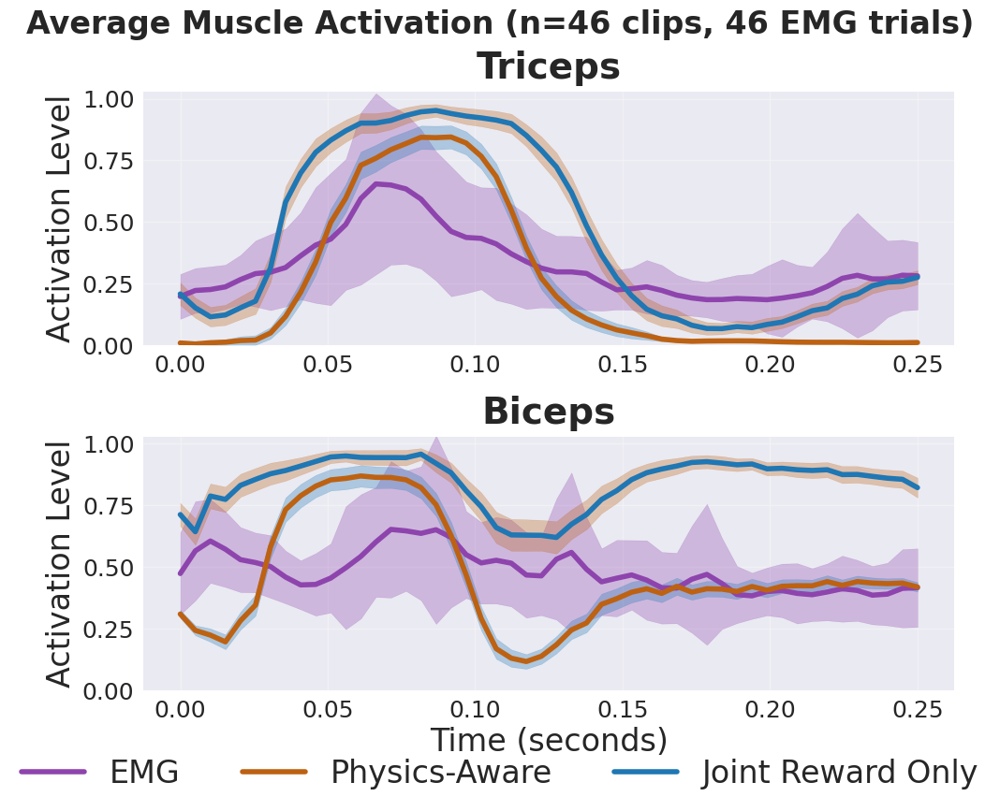

Averaged across 46 simulation clips and 46 EMG trials


In [ ]:
# Calculate averages and standard errors across all clips
print("Computing averaged muscle activations across all clips...")

# Create single averaged plot
fig, axes = plt.subplots(2, 1, figsize=(10, 8))

legend_handles = []
legend_labels = []
legend_created = False

for muscle_idx, (sim_muscle_idx, sim_name, emg_file, muscle_name) in enumerate(MUSCLE_CONFIGS):
    ax = axes[muscle_idx]
    
    # Process EMG data - average across trials
    emg_traces = emg_data_by_muscle[muscle_name]
    if emg_traces is not None and len(emg_traces) > 0:
        emg_mean = np.mean(emg_traces, axis=0)
        emg_sem = np.std(emg_traces, axis=0) / np.sqrt(len(emg_traces))
        
        # Plot EMG with shaded error region
        line = ax.plot(time_axis, emg_mean, 
                      color=colorblind_colors[2], linewidth=4.0, label='EMG')[0]
        ax.fill_between(time_axis, emg_mean - emg_sem, emg_mean + emg_sem,
                        color=colorblind_colors[2], alpha=0.3)
        if not legend_created:
            legend_handles.append(line)
            legend_labels.append('EMG')
    
    # Process Physics-Aware model - average across clips
    physics_mean = np.mean(actions[:, :, sim_muscle_idx], axis=0)
    physics_sem = np.std(actions[:, :, sim_muscle_idx], axis=0) / np.sqrt(len(actions))
    
    line = ax.plot(time_axis, physics_mean,
                  color=colorblind_colors[1], linewidth=4.0, label='Physics-Aware')[0]
    ax.fill_between(time_axis, physics_mean - physics_sem, physics_mean + physics_sem,
                    color=colorblind_colors[0], alpha=0.3)
    if not legend_created:
        legend_handles.append(line)
        legend_labels.append('Physics-Aware')
    
    # Process Joint Reward Only model - average across clips
    joint_mean = np.mean(joint_actions[:, :, sim_muscle_idx], axis=0)
    joint_sem = np.std(joint_actions[:, :, sim_muscle_idx], axis=0) / np.sqrt(len(joint_actions))
    
    line = ax.plot(time_axis, joint_mean,
                  color=colorblind_colors[0], linewidth=4.0, label='Joint Reward Only')[0]
    ax.fill_between(time_axis, joint_mean - joint_sem, joint_mean + joint_sem,
                    color=colorblind_colors[1], alpha=0.3)
    if not legend_created:
        legend_handles.append(line)
        legend_labels.append('Joint Reward Only')
    
    legend_created = True
    
    # Customize subplot
    ax.set_title(f'{muscle_name}', fontsize=28, fontweight='bold', pad=10)
    ax.set_ylabel('Activation Level', fontsize=24)
    if muscle_idx == len(MUSCLE_CONFIGS) - 1:
        ax.set_xlabel('Time (seconds)', fontsize=24)
    ax.set_ylim(0, 1.03)
    ax.grid(True, alpha=0.3)
    ax.tick_params(axis='both', which='major', labelsize=18)

# Add legend
fig.legend(legend_handles, legend_labels, 
          loc='lower center', fontsize=24, 
          bbox_to_anchor=(0.5, -0.05), ncol=3, framealpha=0.9)

# Add overall title
n_trials_emg = len(emg_traces) if emg_traces is not None else 0
fig.suptitle(f'Average Muscle Activation (n={n_clips} clips, {n_trials_emg} EMG trials)', 
            fontsize=24, fontweight='bold', y=1.03)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(bottom=0.12, top=0.92)

# Save figure
plt.savefig(ckpt_path / "average_muscle_comparison.pdf", bbox_inches='tight')
plt.show()

print(f"Averaged across {n_clips} simulation clips and {n_trials_emg} EMG trials")

## Neural Network Activation Analysis

Visualize the high-dimensional activation space using PCA.

Processing neural network activations...
Decoder Layer 0 - Explained variance: [27.2 18.5 14.1]
Decoder Layer 1 - Explained variance: [25.5 15.9 10.8]
Decoder Layer 2 - Explained variance: [55.5 15.7  6.5]
Intentions - Explained variance: [44.3 33.2 20.1]


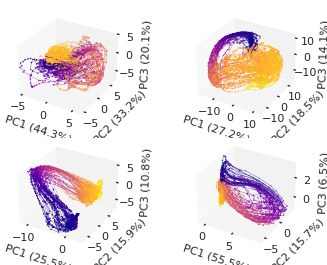

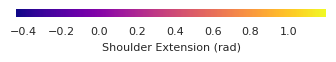

Global shoulder angle range: -0.439 to 1.200 radians


In [13]:
def plot_subplot(data, color_array, title, labels, ax, norm, cmap):
    """Plot 3D trajectory with color-coded points"""
    ax.tick_params(axis="both", which="major", labelsize=8, pad=-4)
    ax.tick_params(axis="z", which="major", labelsize=8, pad=-3)
    ax.set_facecolor("white")
    ax.grid(False)

    x_range = data[:, :, 0].max() - data[:, :, 0].min()
    y_range = data[:, :, 1].max() - data[:, :, 1].min()
    z_range = data[:, :, 2].max() - data[:, :, 2].min()
    ratio = -0.005

    ax.set_xlim(data[:, :, 0].min() - x_range * ratio, data[:, :, 0].max() + x_range * ratio)
    ax.set_ylim(data[:, :, 1].min() - y_range * ratio, data[:, :, 1].max() + y_range * ratio)
    ax.set_zlim(data[:, :, 2].min() - z_range * ratio, data[:, :, 2].max() + z_range * ratio)

    ax.set_xlabel(labels[0], fontsize=8, labelpad=-8, rotation=-16)
    ax.set_ylabel(labels[1], fontsize=8, labelpad=-8, rotation=55)
    ax.set_zlabel(labels[2], fontsize=8, labelpad=-8, rotation=90)

    for n in range(data.shape[0]):
        d = data[n]
        lc_color = cmap(norm(color_array[n, :-1]))
        line_data = np.stack([d[:-1], d[1:]], axis=1)
        lc = Line3DCollection(line_data, colors=lc_color, linewidths=0.2)
        ax.add_collection3d(lc)
        ax.scatter(d[:, 0], d[:, 1], d[:, 2], c=color_array[n], cmap=cmap, norm=norm, s=0.5)

def perform_pca_batch(data, layer_name):
    """Perform PCA on batch activation data"""
    pca = PCA(n_components=3)
    concatenated_data = data.reshape(-1, data.shape[-1])
    pca_result = pca.fit_transform(concatenated_data)
    
    batch_size, timesteps, _ = data.shape
    pca_result = pca_result.reshape(batch_size, timesteps, 3)
    
    explained_variance = np.round(pca.explained_variance_ratio_ * 100, 1)
    print(f"{layer_name} - Explained variance: {explained_variance}")
    return pca_result, explained_variance

# Extract activation data
print("Processing neural network activations...")
decoder_layer_0_data = batch_rollout["activations"]["decoder"]["layer_0"]
decoder_layer_1_data = batch_rollout["activations"]["decoder"]["layer_1"] 
decoder_layer_2_data = batch_rollout["activations"]["decoder"]["layer_2"]
intentions_data = batch_rollout["activations"]["intention"]
qpos_data = batch_rollout["qposes_rollout"]

# Find minimum timesteps
min_timesteps = min(
    decoder_layer_0_data.shape[1],
    decoder_layer_1_data.shape[1], 
    decoder_layer_2_data.shape[1],
    intentions_data.shape[1],
    qpos_data.shape[1]
)

# Truncate all arrays
decoder_layer_0_truncated = decoder_layer_0_data[:, :min_timesteps, :]
decoder_layer_1_truncated = decoder_layer_1_data[:, :min_timesteps, :]
decoder_layer_2_truncated = decoder_layer_2_data[:, :min_timesteps, :]
intentions_truncated = intentions_data[:, :min_timesteps, :]
qpos_data_truncated = qpos_data[:, :min_timesteps, :]

# Perform PCA
decoder_layer_0, vars_decoder_layer_0 = perform_pca_batch(decoder_layer_0_truncated, "Decoder Layer 0")
decoder_layer_1, vars_decoder_layer_1 = perform_pca_batch(decoder_layer_1_truncated, "Decoder Layer 1")
decoder_layer_2, vars_decoder_layer_2 = perform_pca_batch(decoder_layer_2_truncated, "Decoder Layer 2")
intentions_pca, vars_intentions_pca = perform_pca_batch(intentions_truncated, "Intentions")

# Create data with shoulder extension angle
qpos_data_truncated = np.array(qpos_data_truncated)
decoder_0_with_angle = np.concatenate([decoder_layer_0, qpos_data_truncated[:, :, 2][..., np.newaxis]], axis=2)
decoder_1_with_angle = np.concatenate([decoder_layer_1, qpos_data_truncated[:, :, 2][..., np.newaxis]], axis=2)
decoder_2_with_angle = np.concatenate([decoder_layer_2, qpos_data_truncated[:, :, 2][..., np.newaxis]], axis=2)
intentions_with_angle = np.concatenate([intentions_pca, qpos_data_truncated[:, :, 2][..., np.newaxis]], axis=2)

# Dataset configurations
datasets = {
    "intentions": {"data": intentions_with_angle, "title": "Intentions", "var_exp": vars_intentions_pca},
    "decoder_layer_0": {"data": decoder_0_with_angle, "title": "Decoder Layer 1", "var_exp": vars_decoder_layer_0},
    "decoder_layer_1": {"data": decoder_1_with_angle, "title": "Decoder Layer 2", "var_exp": vars_decoder_layer_1},
    "decoder_layer_2": {"data": decoder_2_with_angle, "title": "Decoder Layer 3", "var_exp": vars_decoder_layer_2},
}

# Find global min/max for colorbar
all_shoulder_angles = [config["data"][:, :, 3] for config in datasets.values()]
global_min = min(angles.min() for angles in all_shoulder_angles)
global_max = max(angles.max() for angles in all_shoulder_angles)

# Create colormap
norm = plt.Normalize(global_min, global_max)
cmap = plt.cm.plasma

# Create 2x2 subplot figure
fig = plt.figure(figsize=(3.75, 3))
fig.patch.set_facecolor("white")
subplot_positions = [(0, 0), (0, 1), (1, 0), (1, 1)]

for i, (key, config) in enumerate(datasets.items()):
    ax = fig.add_subplot(2, 2, i + 1, projection="3d")
    
    trajectory_data = config["data"][:, :, :3]
    shoulder_angles = config["data"][:, :, 3]
    var_exp = config["var_exp"]
    
    labels = [f"PC1 ({var_exp[0]:.1f}%)", f"PC2 ({var_exp[1]:.1f}%)", f"PC3 ({var_exp[2]:.1f}%)"]
    
    plot_subplot(trajectory_data, shoulder_angles, config["title"], labels, ax, norm, cmap)
    
    if key == "intentions":
        ax.set_xticks([-5, 0, 5])
        ax.set_yticks([-5, 0, 5])
        ax.set_zticks([-5, 0, 5])

plt.subplots_adjust(left=0.00, right=0.95, top=0.90, bottom=0.10, wspace=0.0, hspace=0.15)
plt.savefig(ckpt_path / "arm_latent_space_2x2_batch.pdf", pad_inches=0.2)
plt.show()

# Create colorbar
fig_cbar, ax_cbar = plt.subplots(figsize=(4, 0.1))
fig_cbar.patch.set_facecolor("white")
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, cax=ax_cbar, orientation="horizontal")
plt.tick_params(labelsize=8)
cbar.set_label("Shoulder Extension (rad)", fontsize=8)
ax_cbar.set_frame_on(False)
plt.savefig(ckpt_path / "arm_latent_space_colorbar_batch.pdf", bbox_inches="tight")
plt.show()

print(f"Global shoulder angle range: {global_min:.3f} to {global_max:.3f} radians")


EMG ERROR ANALYSIS
Physics-Aware model: 46 clips, 119 timesteps
Joint Reward Only model: (46, 119, 9)

Processing EMG data for error analysis...
  Processing Triceps...
  Processing Biceps...

Calculating errors for Physics-Aware...
  Triceps: Processed 46 clips
  Biceps: Processed 46 clips

Calculating errors for Joint Reward Only...
  Triceps: Processed 46 clips
  Biceps: Processed 46 clips


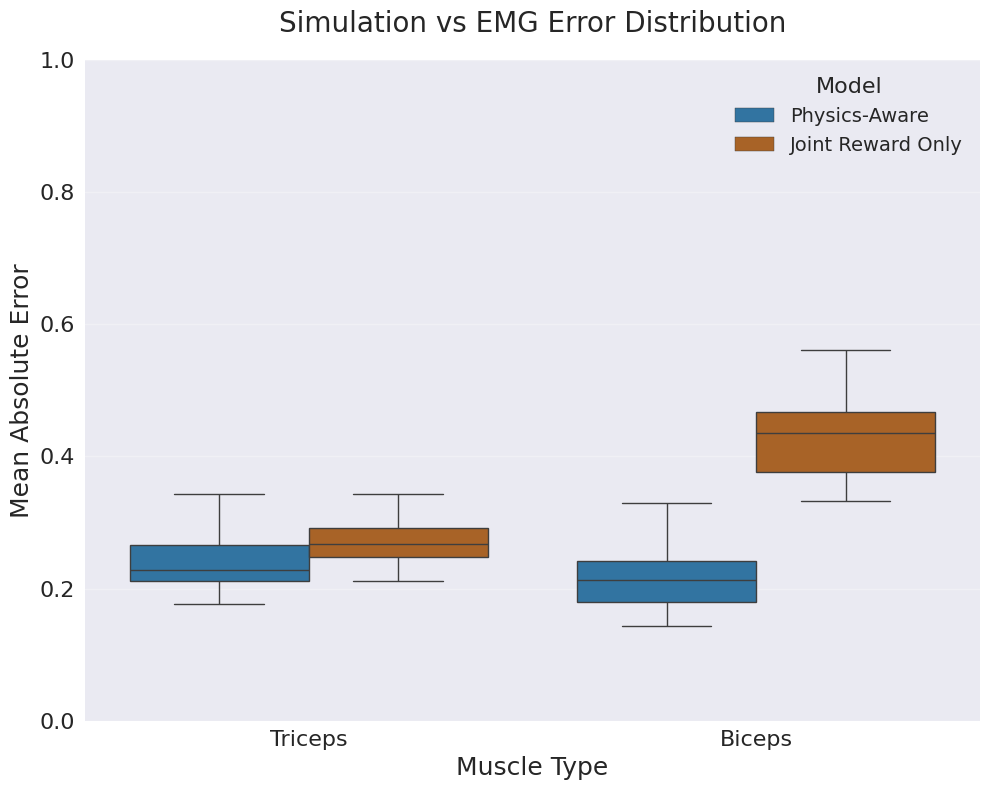


ERROR ANALYSIS SUMMARY

Physics-Aware:
--------------------------------------------------

  Triceps:
    Mean:    0.2405
    Median:  0.2276
    Std:     0.0442
    Q1:      0.2120
    Q3:      0.2652

  Biceps:
    Mean:    0.2255
    Median:  0.2132
    Std:     0.0698
    Q1:      0.1790
    Q3:      0.2414

Joint Reward Only:
--------------------------------------------------

  Triceps:
    Mean:    0.2783
    Median:  0.2678
    Std:     0.0501
    Q1:      0.2480
    Q3:      0.2918

  Biceps:
    Mean:    0.4282
    Median:  0.4352
    Std:     0.0558
    Q1:      0.3768
    Q3:      0.4674

COMPARISON:
--------------------------------------------------

Triceps:
  Joint Reward Only Mean Error:  0.2783
  Physics-Aware Mean Error:      0.2405
  Improvement:                   0.0378
  Percent Change:                13.59%

Biceps:
  Joint Reward Only Mean Error:  0.4282
  Physics-Aware Mean Error:      0.2255
  Improvement:                   0.2027
  Percent Change:            

In [14]:
# --------------------------- EMG ERROR ANALYSIS -----------------------------------
print("\n" + "="*80)
print("EMG ERROR ANALYSIS")
print("="*80)

# Use full 500ms duration for error analysis
actions_full = np.clip(batch_rollout["ctrl"], 0.0, 1.0)
n_clips_full, T_full, _ = actions_full.shape
target_samples_full = T_full  # Use full simulation timesteps (100 for 500ms)

print(f"Physics-Aware model: {n_clips_full} clips, {T_full} timesteps")

# Extract Joint Reward Only model data (full duration)
joint_actions_full = np.clip(joint_batch_rollout["ctrl"], 0.0, 1.0)
print(f"Joint Reward Only model: {joint_actions_full.shape}")

# Process EMG data for full duration (500ms)
print("\nProcessing EMG data for error analysis...")
emg_data_full = {}
for sim_muscle_idx, sim_name, emg_file, muscle_name in MUSCLE_CONFIGS:
    print(f"  Processing {muscle_name}...")
    emg_traces = process_emg_data_individual_trials(emg_file, target_samples_full, 
                                                     num_trials=n_clips_full, 
                                                     duration_ms=500)
    emg_data_full[muscle_name] = emg_traces

# Calculate errors for both models
all_errors_data = []

for condition_name, actions_data in [("Physics-Aware", actions_full), 
                                     ("Joint Reward Only", joint_actions_full)]:
    print(f"\nCalculating errors for {condition_name}...")
    
    for muscle_idx, sim_name, emg_file, muscle_name in MUSCLE_CONFIGS:
        emg_traces = emg_data_full[muscle_name]
        
        if emg_traces is not None:
            # Get simulation traces for this muscle
            sim_traces = actions_data[:, :, muscle_idx]
            
            # Match number of clips between sim and EMG
            n_clips_to_use = min(len(sim_traces), len(emg_traces))
            
            # Calculate error for each clip
            for clip_idx in range(n_clips_to_use):
                sim_trace = sim_traces[clip_idx, :]
                emg_trace = emg_traces[clip_idx, :]
                
                # Ensure same length
                min_len = min(len(sim_trace), len(emg_trace))
                sim_trace = sim_trace[:min_len]
                emg_trace = emg_trace[:min_len]
                
                # Calculate mean absolute error
                clip_error = np.mean(np.abs(sim_trace - emg_trace))
                
                all_errors_data.append({
                    'Condition': condition_name,
                    'Muscle': muscle_name,
                    'Error': clip_error,
                    'Clip': clip_idx
                })
            
            print(f"  {muscle_name}: Processed {n_clips_to_use} clips")

# Create DataFrame
df_errors = pd.DataFrame(all_errors_data)

# Create grouped box and whisker plot
fig, ax = plt.subplots(figsize=(10, 8))

# Create grouped box plot
box_plot = sns.boxplot(data=df_errors, x='Muscle', y='Error', hue='Condition',
                      palette=['#1f77b4', '#bd6212'],  # Blue for Physics-Aware, Orange for Joint Reward Only
                      ax=ax, showfliers=False)

# Customize the plot
ax.set_xlabel('Muscle Type', fontsize=18)
ax.set_ylabel('Mean Absolute Error', fontsize=18)
ax.set_title('Simulation vs EMG Error Distribution', fontsize=20, pad=20)
ax.tick_params(axis='both', which='major', labelsize=16)
ax.set_ylim(0, 1.0)

# Customize legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels, title='Model', title_fontsize=16, fontsize=14, loc='upper right')

# Add grid
ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig(ckpt_path / "emg_error_boxplot.pdf", bbox_inches='tight')
plt.show()

# Print summary statistics
print("\n" + "="*80)
print("ERROR ANALYSIS SUMMARY")
print("="*80)

for condition in df_errors['Condition'].unique():
    print(f"\n{condition}:")
    print("-" * 50)
    
    condition_data = df_errors[df_errors['Condition'] == condition]
    
    for muscle in condition_data['Muscle'].unique():
        muscle_data = condition_data[condition_data['Muscle'] == muscle]['Error']
        print(f"\n  {muscle}:")
        print(f"    Mean:    {muscle_data.mean():.4f}")
        print(f"    Median:  {muscle_data.median():.4f}")
        print(f"    Std:     {muscle_data.std():.4f}")
        print(f"    Q1:      {muscle_data.quantile(0.25):.4f}")
        print(f"    Q3:      {muscle_data.quantile(0.75):.4f}")

# Comparison analysis
print(f"\n{'COMPARISON:'}")
print("-" * 50)

for muscle in df_errors['Muscle'].unique():
    print(f"\n{muscle}:")
    
    physics_aware = df_errors[(df_errors['Condition'] == 'Physics-Aware') & 
                              (df_errors['Muscle'] == muscle)]['Error']
    joint_only = df_errors[(df_errors['Condition'] == 'Joint Reward Only') & 
                           (df_errors['Muscle'] == muscle)]['Error']
    
    if len(physics_aware) > 0 and len(joint_only) > 0:
        improvement = joint_only.mean() - physics_aware.mean()
        percent_change = (improvement / joint_only.mean()) * 100
        
        print(f"  Joint Reward Only Mean Error:  {joint_only.mean():.4f}")
        print(f"  Physics-Aware Mean Error:      {physics_aware.mean():.4f}")
        print(f"  Improvement:                   {improvement:.4f}")
        print(f"  Percent Change:                {percent_change:.2f}%")

print("="*80)